In [1]:
import pandas as pd
import numpy as np
from read_ebas_merged_STN import ebas_nc_to_timetable
from change_point_analysis_V3_model import change_point_analysis_v4
from make_table_breakpoints import make_table_breakpoints
from compute_exp_SSA import compute_exp_ssa

HYY_rd, HYY_st = ebas_nc_to_timetable('merged_Hyytiala.nc')

print(HYY_rd.index[0])
print(HYY_rd.index[-1])

# VARIABLE GROUPS

names_sc = [c for c in HYY_rd.columns if c.startswith("Bs")]
names_bsc = [c for c in HYY_rd.columns if c.startswith("Bbs")]
names_ae = [c for c in HYY_rd.columns if c.startswith("Ba")]

2006-01-01 00:00:00
2025-12-31 00:00:00


In [2]:
# select BRG  
names_aec=names_ae[1],names_ae[4],names_ae[6],names_ae[11],names_ae[14],names_ae[16]

### Plots

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
COLOR_MAP = {"B": "#377eb8",
    "G": "#4daf4a",
    "R": "#e41a1c", }

def get_color(param,col):
    if ("sB" in param) or ("aB" in param) or (col =='blue'):
        return COLOR_MAP["B"]
    elif ("sG" in param) or ("aG" in param) or (col =='green'):
        return COLOR_MAP["G"]
    elif ("sR" in param) or ("aR" in param) or (col =='red'):
        return COLOR_MAP["R"]
    
def plotFigControl(data,var):
    fig, ax=plt.subplots(2,1,figsize=(12, 5), sharex=True)
    ax[0].plot(data.index, data[var], '.', color=get_color(var))
    ax[1].plot(data.index, data[var], '.', color=get_color(var))
    ax[1].set_yscale('log')
    ax[0].set_title(HYY_st["name"])

    for a in ax:
        a.grid(True)
        a.set_ylabel('')

    plt.tight_layout()
    plt.show()

def plotFig_var(data,var,col):
    fig, ax=plt.subplots(2,1,figsize=(12, 5), sharex=True)
    for i in var:
        sns.scatterplot(ax=ax[0],data=data, x=data.index, y=data[i], s=8, color=get_color(i,col), label=i)
        sns.scatterplot(ax=ax[1],data=data, x=data.index, y=data[i], s=8, color=get_color(i,col))
    ax[1].set_yscale('log')

    ax[0].set_title(HYY_st["name"])

    for a in ax:
        a.grid(True)
        a.set_ylabel('')

    plt.tight_layout()
    plt.show()

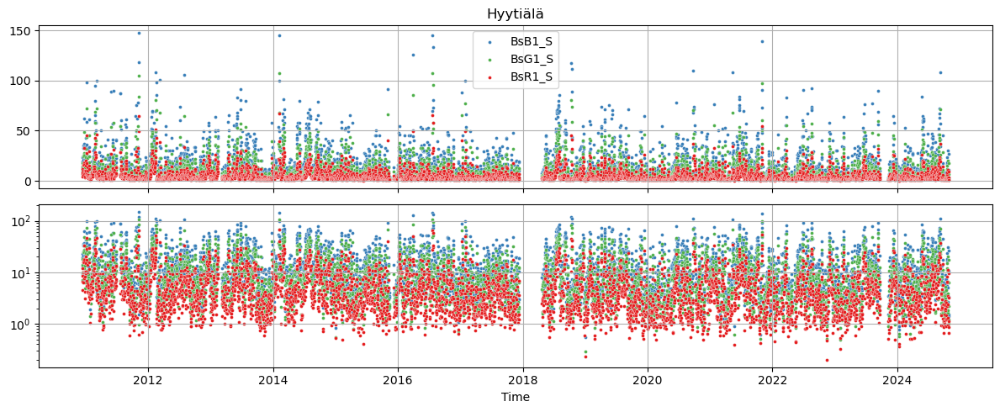

In [93]:
plotFig_var(HYY_rd,names_sc[:3])

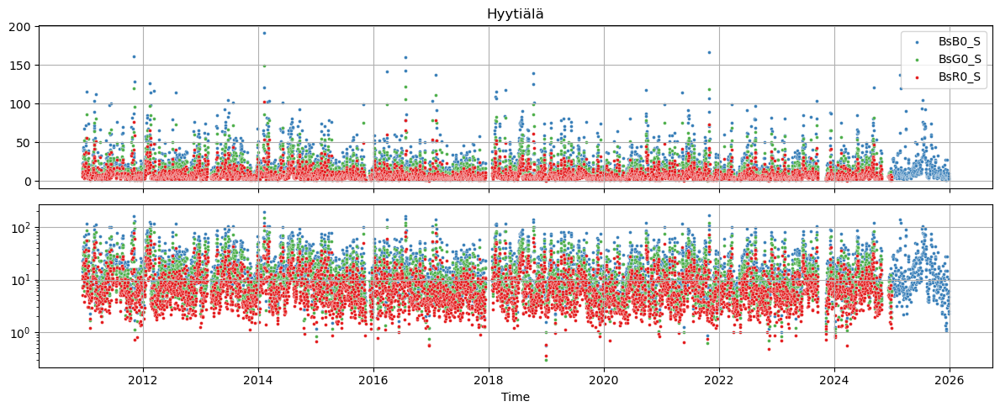

In [22]:
plotFig_var(HYY_rd,names_sc[3:6])

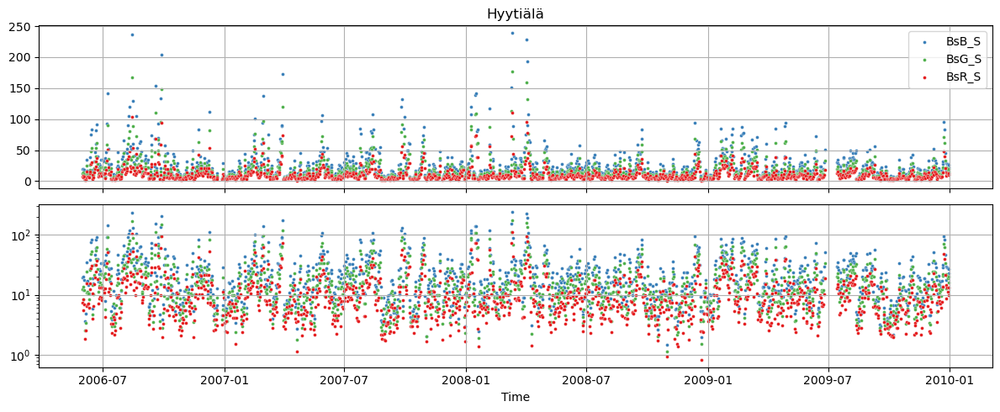

In [23]:
plotFig_var(HYY_rd,names_sc[6:])

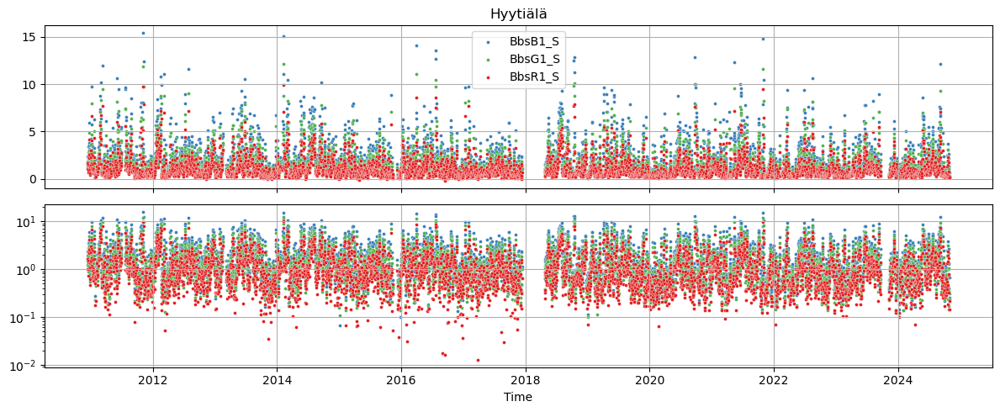

In [24]:
plotFig_var(HYY_rd,names_bsc[:3])

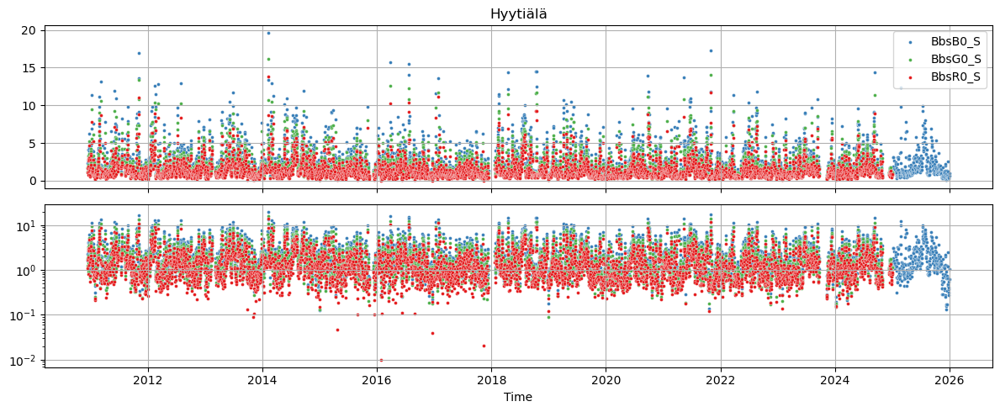

In [28]:
plotFig_var(HYY_rd,names_bsc[3:6])

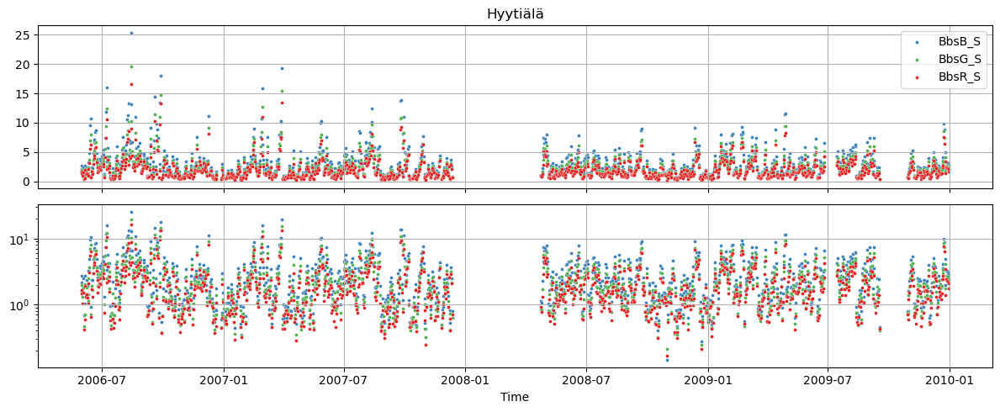

In [27]:
plotFig_var(HYY_rd,names_bsc[6:])

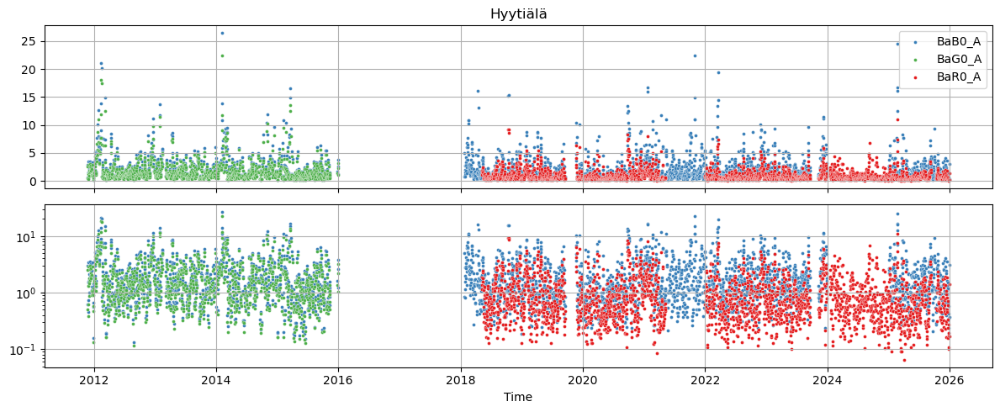

In [26]:
plotFig_var(HYY_rd,names_aec[:3])

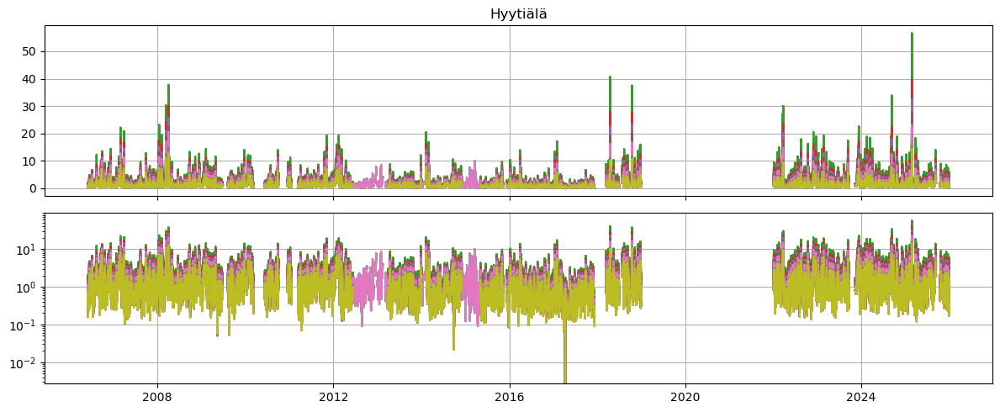

In [83]:
var=['Ba10_A','Ba20_A','Ba30_A','Ba40_A','Ba50_A','Ba60_A','Ba70_A']
plotFig_var(HYY_rd,var) 

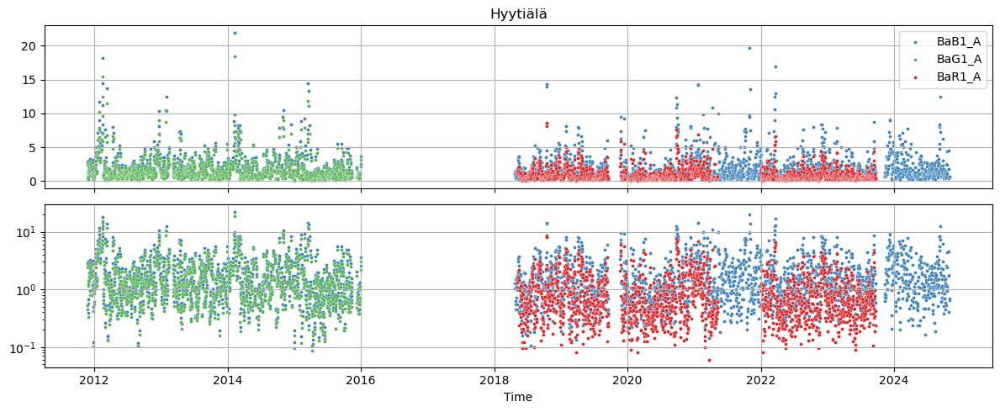

In [25]:
plotFig_var(HYY_rd,names_aec[3:6])

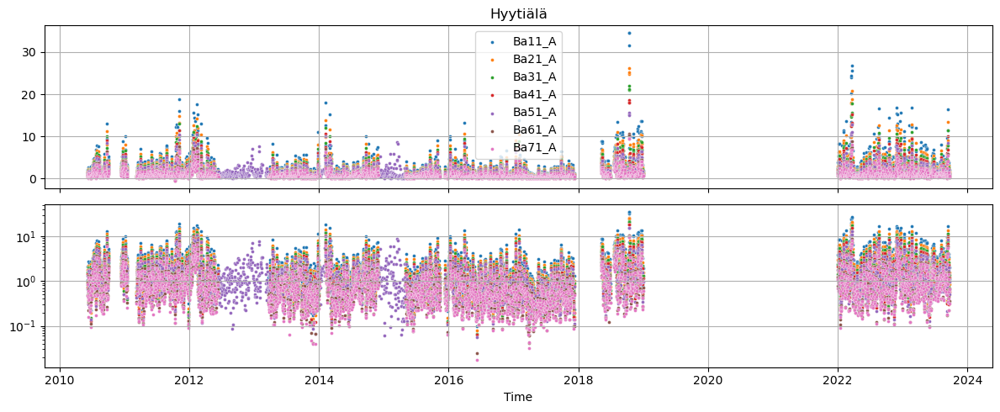

In [10]:
var=['Ba11_A','Ba21_A','Ba31_A','Ba41_A','Ba51_A','Ba61_A','Ba71_A']
plotFig_var(HYY_rd,var) 

### break point detection SNHT

#### PM1

##### scattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

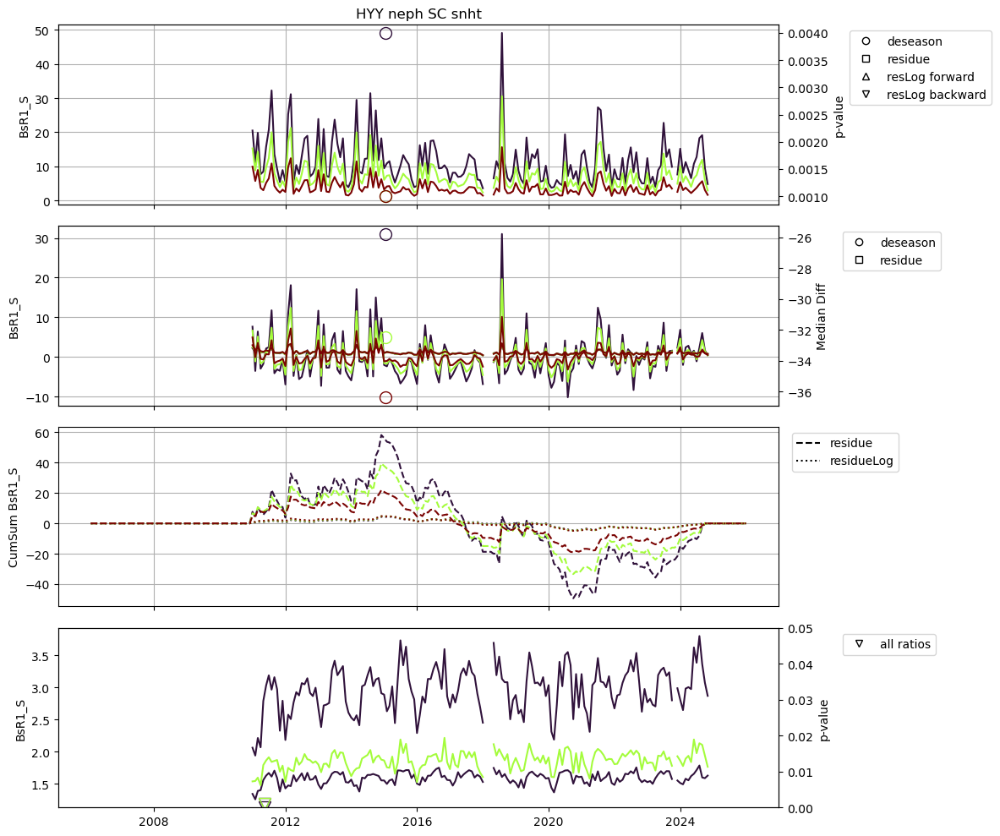

In [29]:
break_HYY_scat = change_point_analysis_v4(HYY_rd,names_sc[:3],0.05,'HYY','neph SC', 'snht')
T_HYY_scat = make_table_breakpoints(break_HYY_scat, 'snht')

In [30]:
T_HYY_scat

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BsB1_S_BsG1_S,2011-04-30,0.000,1.0,13.495882,14.605804,17.638282
1,BsB1_S_BsR1_S,2011-04-30,0.001,1.0,23.302386,31.706678,36.184731
2,BsG1_S_BsR1_S,2011-04-30,0.001,1.0,12.077967,17.560054,21.749703
3,BsB1_S_deseason,2014-12-31,0.004,1.0,-31.771264,-25.778964,-43.001636
4,BsG1_S_deseason,2014-12-31,0.001,1.0,-36.373159,-32.458280,-48.652175
5,BsR1_S_deseason,2014-12-31,0.001,1.0,-35.999285,-36.358038,-59.958626


##### backscattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

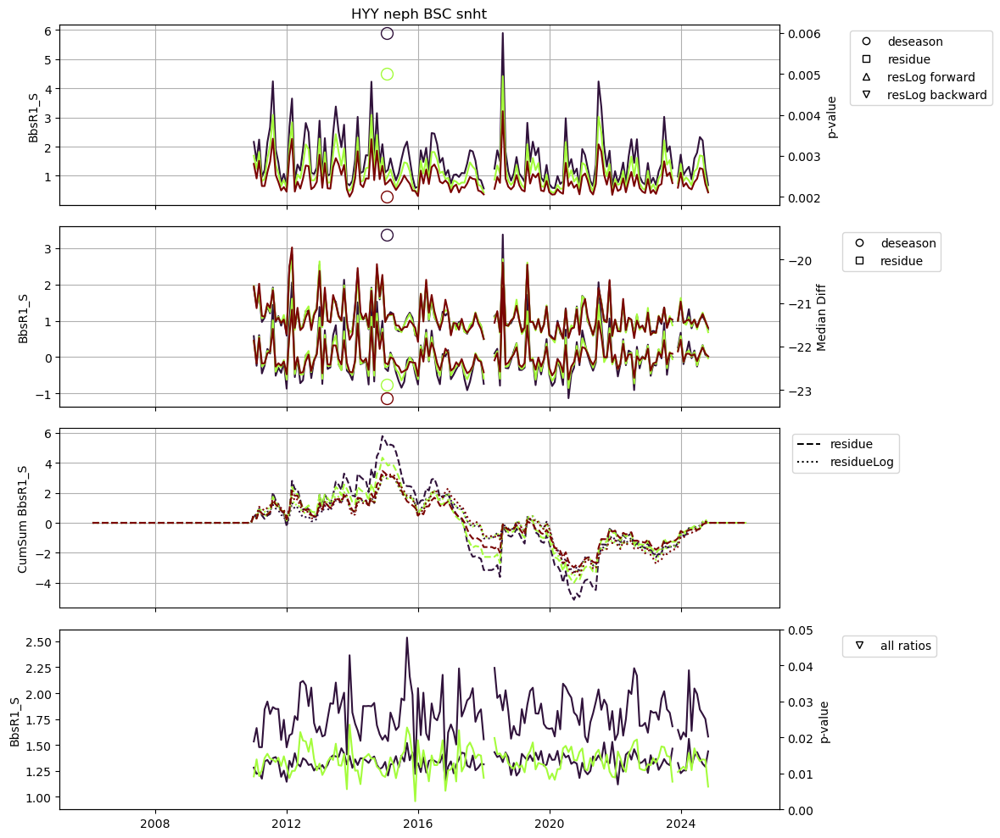

In [31]:
break_HYY_bscat = change_point_analysis_v4(HYY_rd,names_bsc[:3],0.05,'HYY','neph BSC','snht')
T_HYY_bscat = make_table_breakpoints(break_HYY_bscat, 'snht')

In [32]:
T_HYY_bscat

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BbsB1_S_deseason,2014-12-31,0.006,1.0,-23.066853,-19.423523,-42.455088
1,BbsG1_S_deseason,2014-12-31,0.005,1.0,-27.538705,-22.889851,-38.527914
2,BbsR1_S_deseason,2014-12-31,0.002,1.0,-25.744299,-23.192548,-46.515612


##### absorption

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

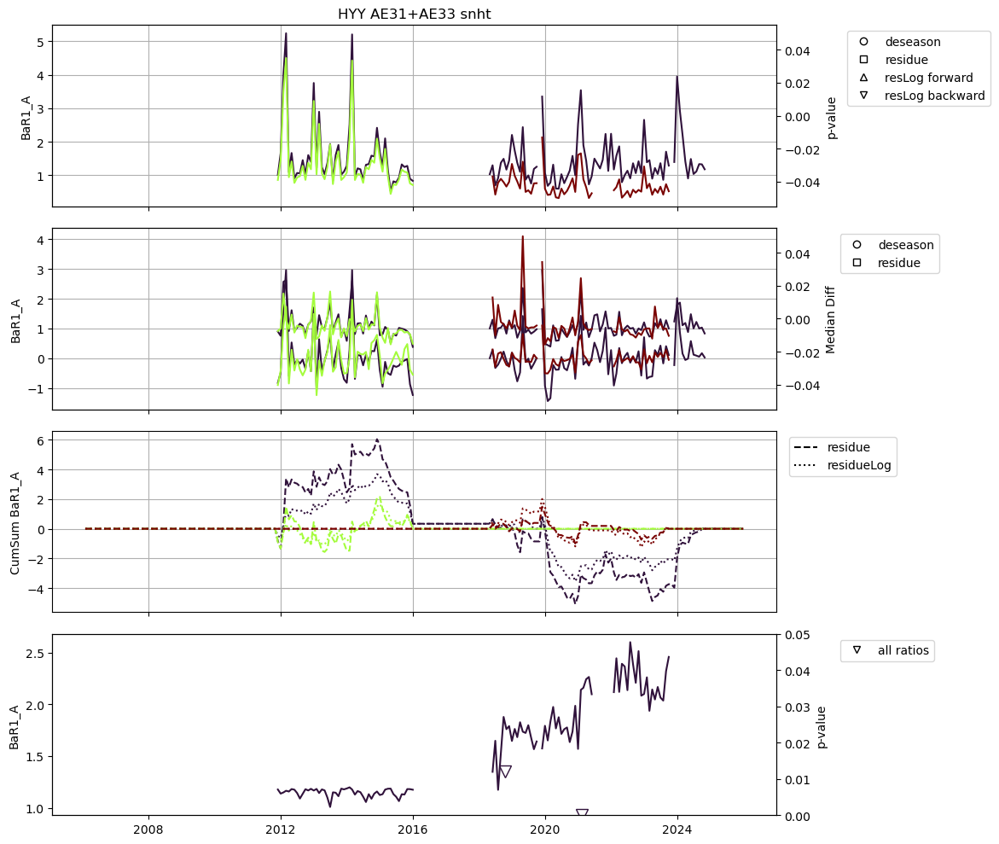

In [22]:
break_HYY_abs = change_point_analysis_v4(HYY_rd,names_aec[3:],0.05,'HYY','AE31+AE33','snht')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

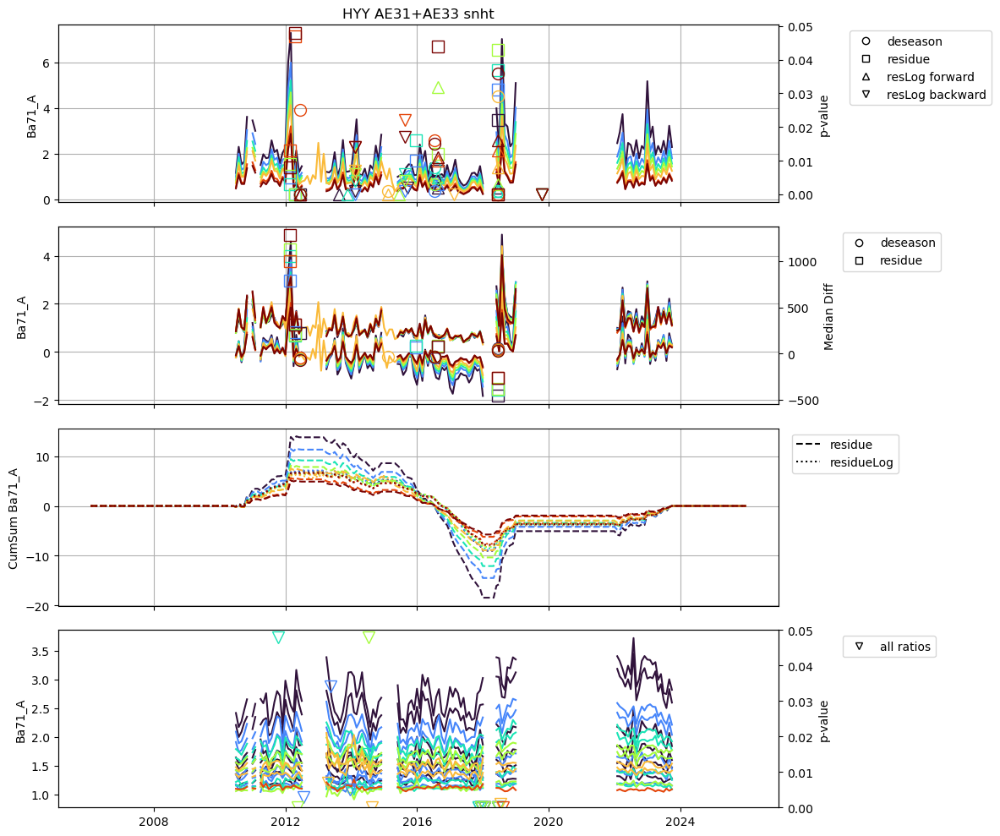

In [11]:
var=['Ba11_A','Ba21_A','Ba31_A','Ba41_A','Ba51_A','Ba61_A','Ba71_A']
break_HYY_abs = change_point_analysis_v4(HYY_rd,var,0.05,'HYY','AE31+AE33','snht')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'snht')

#### PM10

##### scattering

In [26]:
T_HYY_scat

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BsG0_S_deseason,2014-12-31,0.000,1.0,-27.406786,-21.707645,-44.092798
1,BsR0_S_deseason,2014-12-31,0.000,1.0,-31.800703,-19.540780,-42.542775
2,BsB0_S_deseason,2015-03-31,0.003,1.0,-20.426580,-23.354654,-48.550095


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

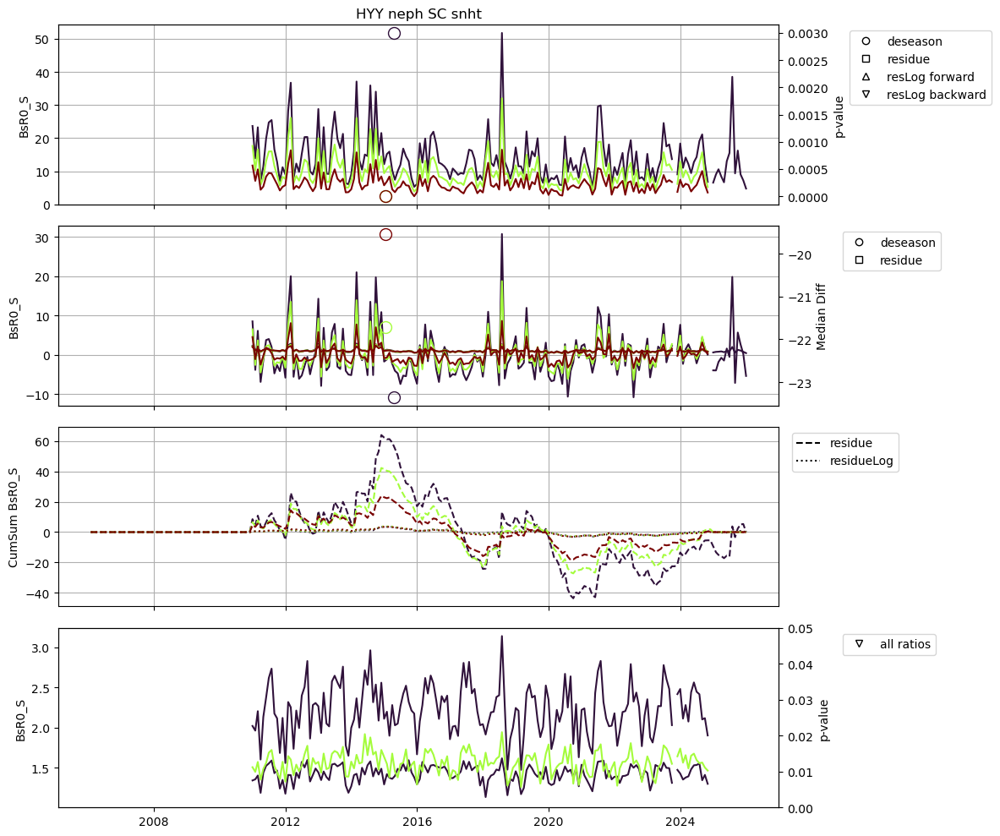

In [25]:
break_HYY_scat = change_point_analysis_v4(HYY_rd,names_sc[3:6],0.05,'HYY','neph SC', 'snht')
T_HYY_scat = make_table_breakpoints(break_HYY_scat, 'snht')

##### backscattering

In [28]:
T_HYY_bscat

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BbsG0_S_deseason,2014-12-31,0.007,1.0,-23.235585,-17.125614,-35.313304
1,BbsR0_S_deseason,2014-12-31,0.004,1.0,-19.329741,-18.069723,-39.561725
2,BbsB0_S_deseason,2015-04-30,0.000,1.0,-22.224345,-20.392665,-34.899592
3,BbsB0_S_BbsG0_S,2024-12-31,0.000,1.0,-18.103021,-22.869624,-27.152921


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

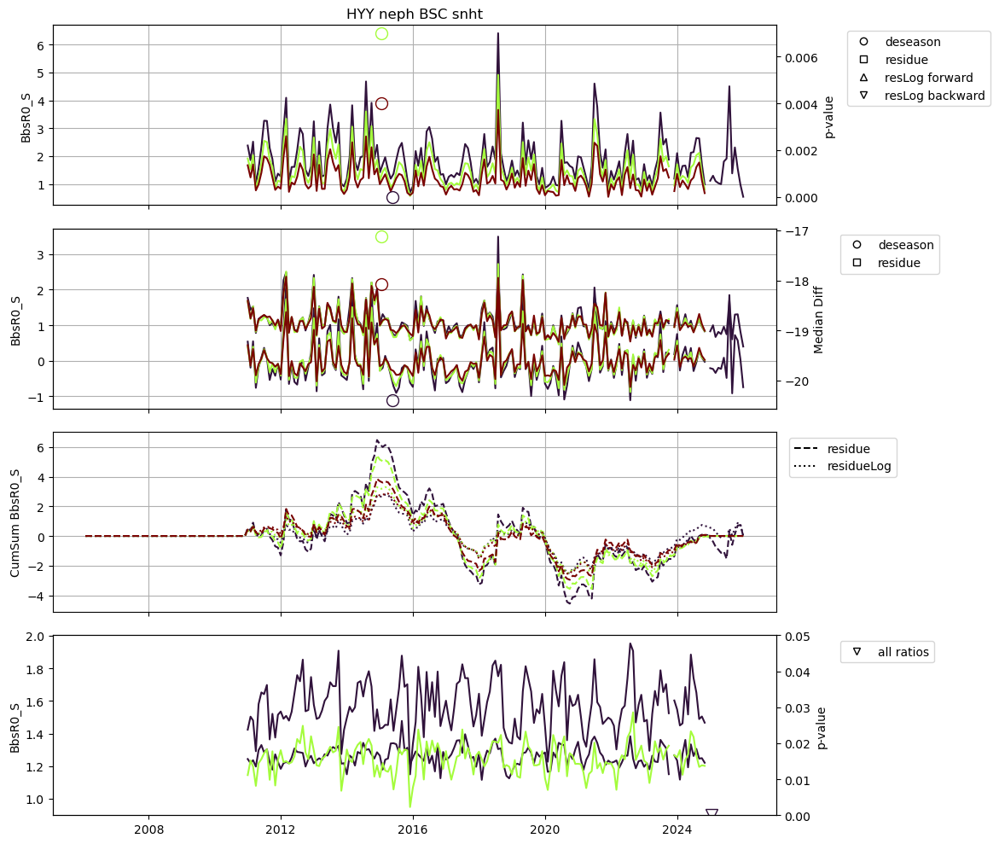

In [27]:
break_HYY_bscat = change_point_analysis_v4(HYY_rd,names_bsc[3:6],0.05,'HYY','neph BSC','snht')
T_HYY_bscat = make_table_breakpoints(break_HYY_bscat, 'snht')

##### absorption

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

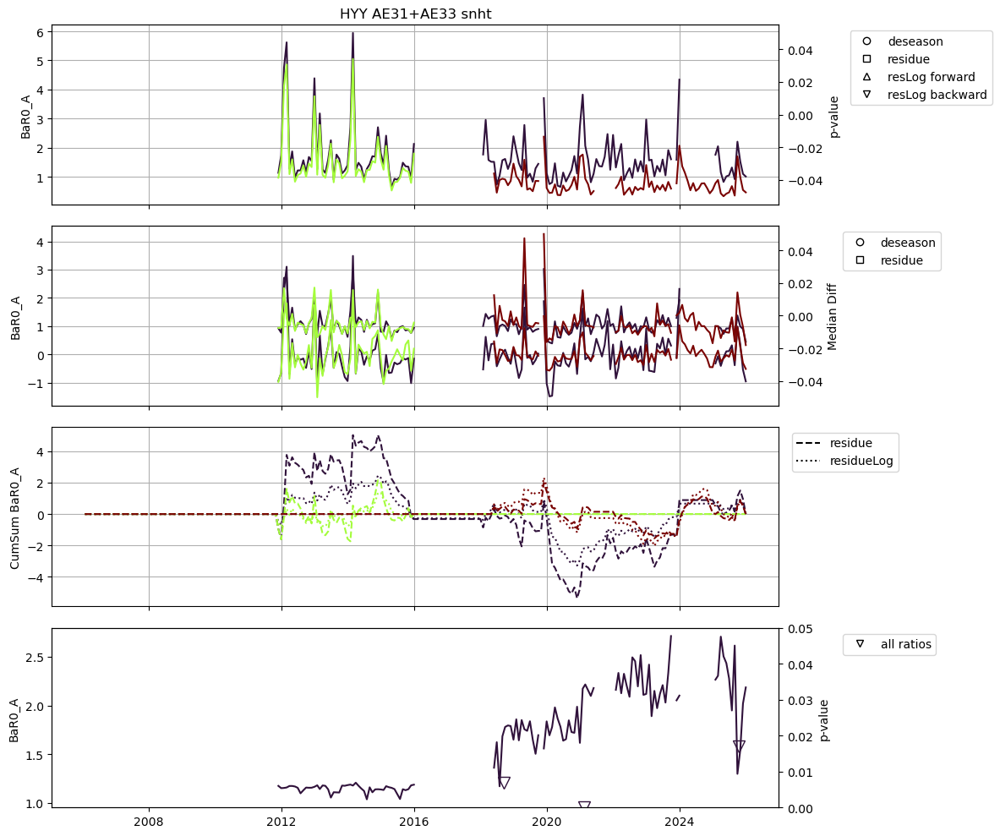

In [3]:
break_HYY_abs = change_point_analysis_v4(HYY_rd,names_aec[:3],0.05,'HYY','AE31+AE33','snht')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

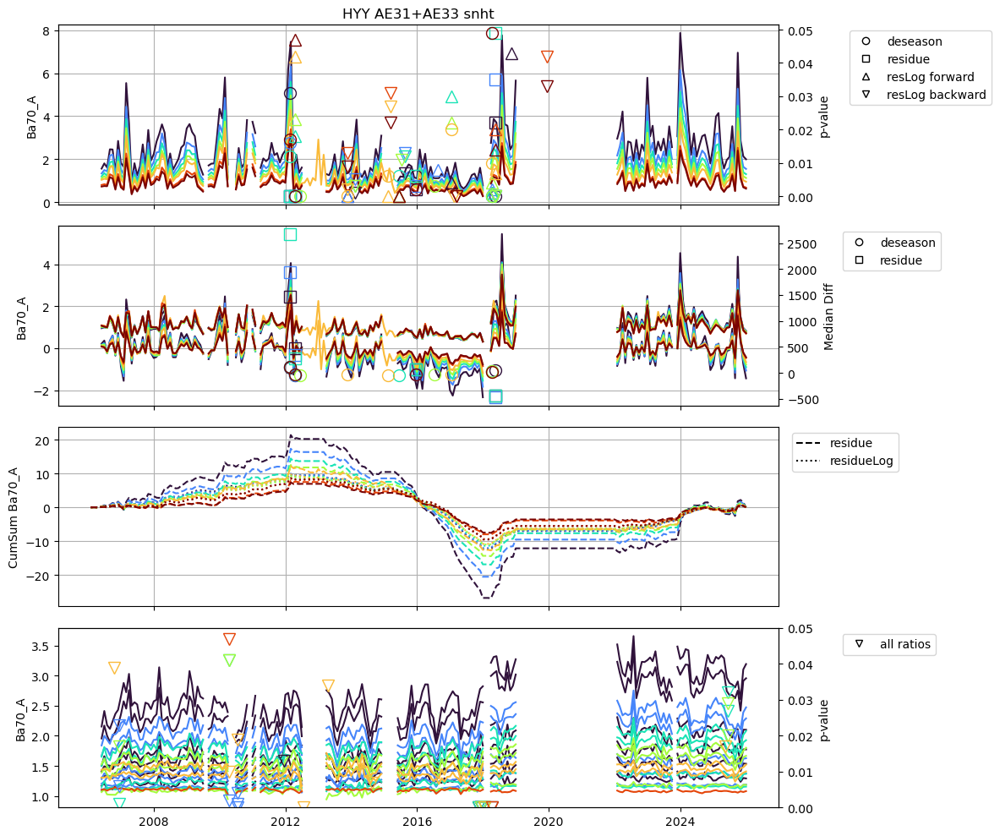

In [7]:
var=['Ba10_A','Ba20_A','Ba30_A','Ba40_A','Ba50_A','Ba60_A','Ba70_A']
break_HYY_abs = change_point_analysis_v4(HYY_rd,var,0.05,'HYY','AE31+AE33','snht')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'snht')

#### TSP

##### scattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

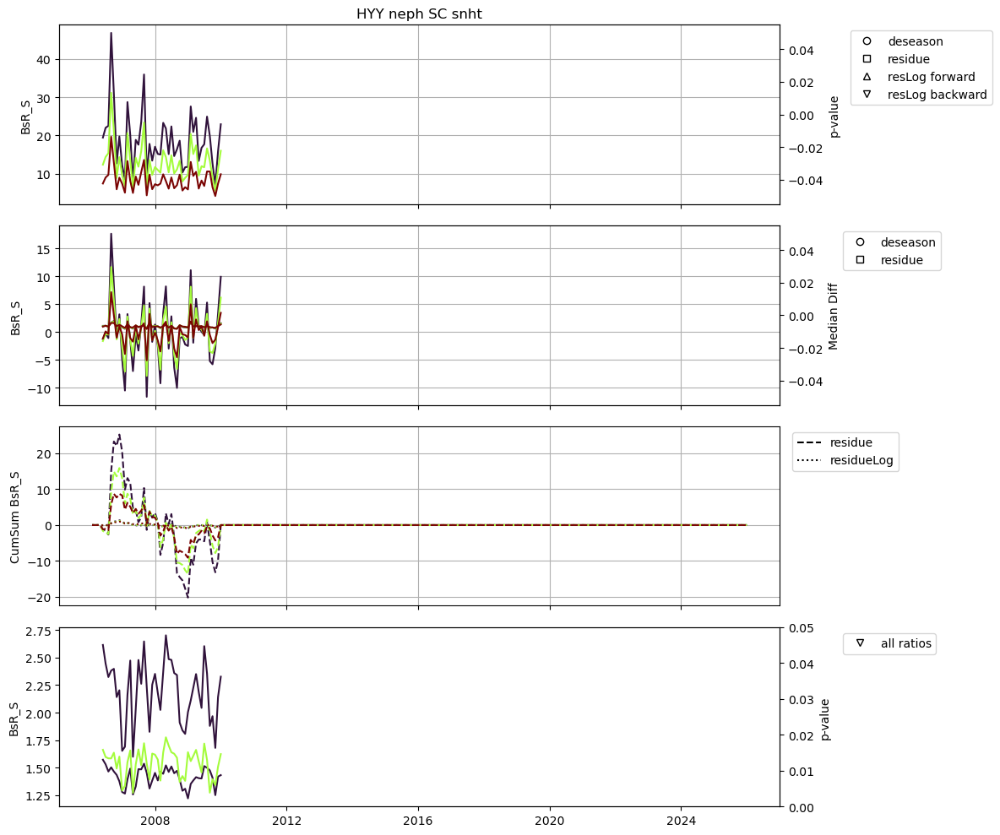

KeyError: 'Break_point'

In [12]:
break_HYY_scat = change_point_analysis_v4(HYY_rd,names_sc[6:],0.05,'HYY','neph SC', 'snht')
T_HYY_scat = make_table_breakpoints(break_HYY_scat, 'snht')

##### backscattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

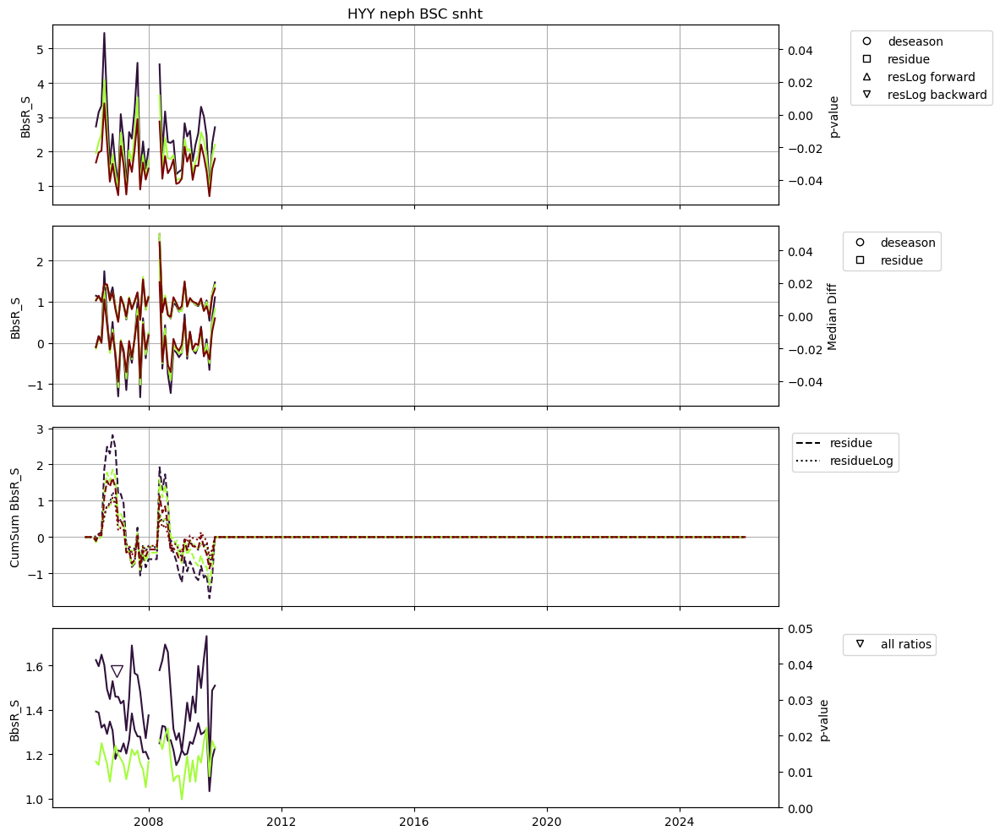

In [13]:
break_HYY_bscat = change_point_analysis_v4(HYY_rd,names_bsc[6:],0.05,'HYY','neph BSC','snht')
T_HYY_bscat = make_table_breakpoints(break_HYY_bscat, 'snht')

##### absorption

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

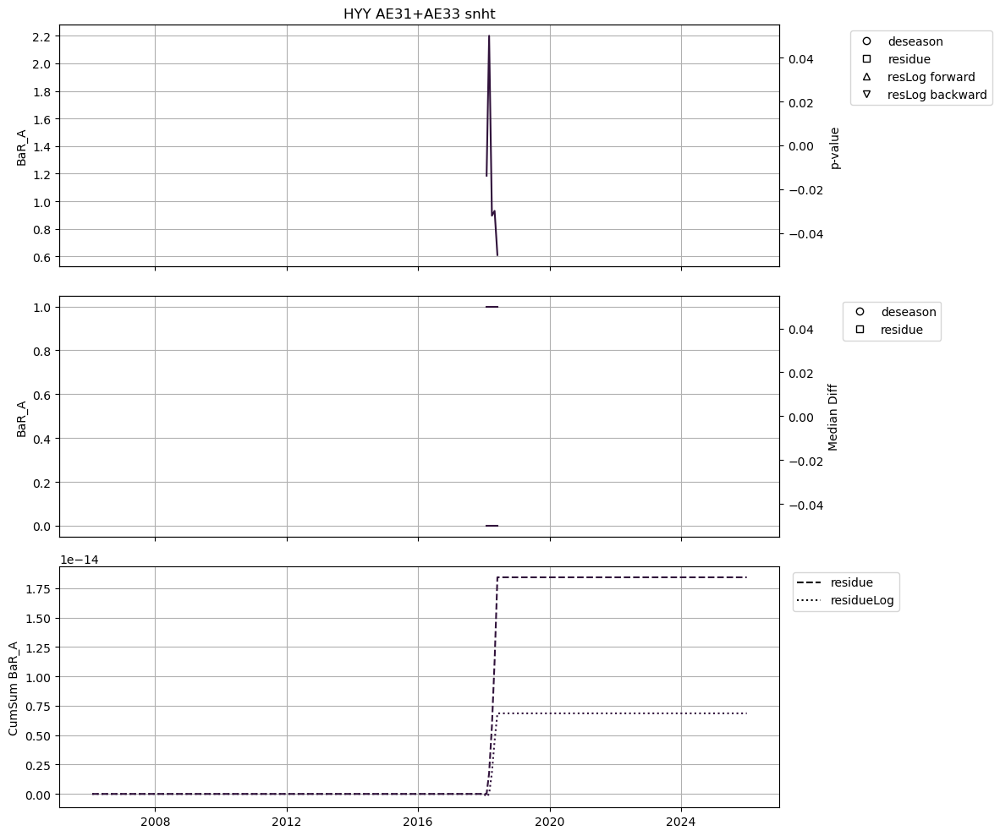

KeyError: 'Break_point'

In [14]:
break_HYY_abs = change_point_analysis_v4(HYY_rd,names_ae[-1:],0.05,'HYY','AE31+AE33','snht')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'snht')

### break point detection Pettitt

#### PM1

##### scattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

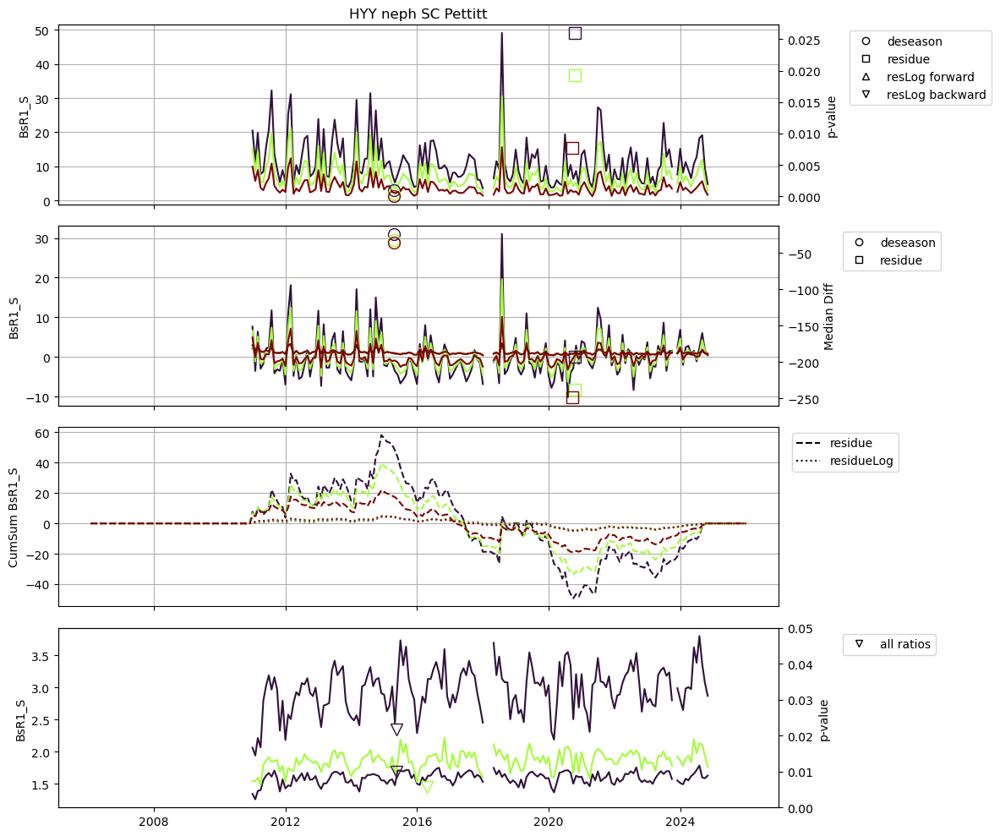

In [33]:
break_HYY_scat = change_point_analysis_v4(HYY_rd,names_sc[:3],0.05,'HYY','neph SC', 'Pettitt')
T_HYY_scat = make_table_breakpoints(break_HYY_scat, 'Pettitt')

In [34]:
T_HYY_scat

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BsB1_S_deseason,2015-03-31,0.000996,0.000500,1.0,-32.748672,-23.895787,-39.725229
1,BsG1_S_deseason,2015-03-31,0.000420,0.000200,1.0,-36.751696,-31.716884,-46.294819
2,BsR1_S_deseason,2015-03-31,0.000037,0.000100,1.0,-36.067979,-35.669434,-58.706763
3,BsB1_S_BsG1_S,2015-04-30,0.021753,0.014499,1.0,6.734438,2.483815,2.385317
4,BsB1_S_BsR1_S,2015-04-30,0.009869,0.007799,1.0,10.596375,6.316489,7.893208
5,BsG1_S_BsR1_S,2016-03-31,0.005668,0.003900,1.0,4.751351,4.539666,2.843458
6,BsR1_S_residue,2020-08-31,0.007758,0.005899,1.0,-54.618905,-248.690774,-41.695762
7,BsB1_S_residue,2020-09-30,0.025988,0.020598,1.0,-54.882207,-193.112918,-22.762102
8,BsG1_S_residue,2020-09-30,0.019282,0.013799,1.0,-53.564766,-237.688101,-18.573801


##### backscattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

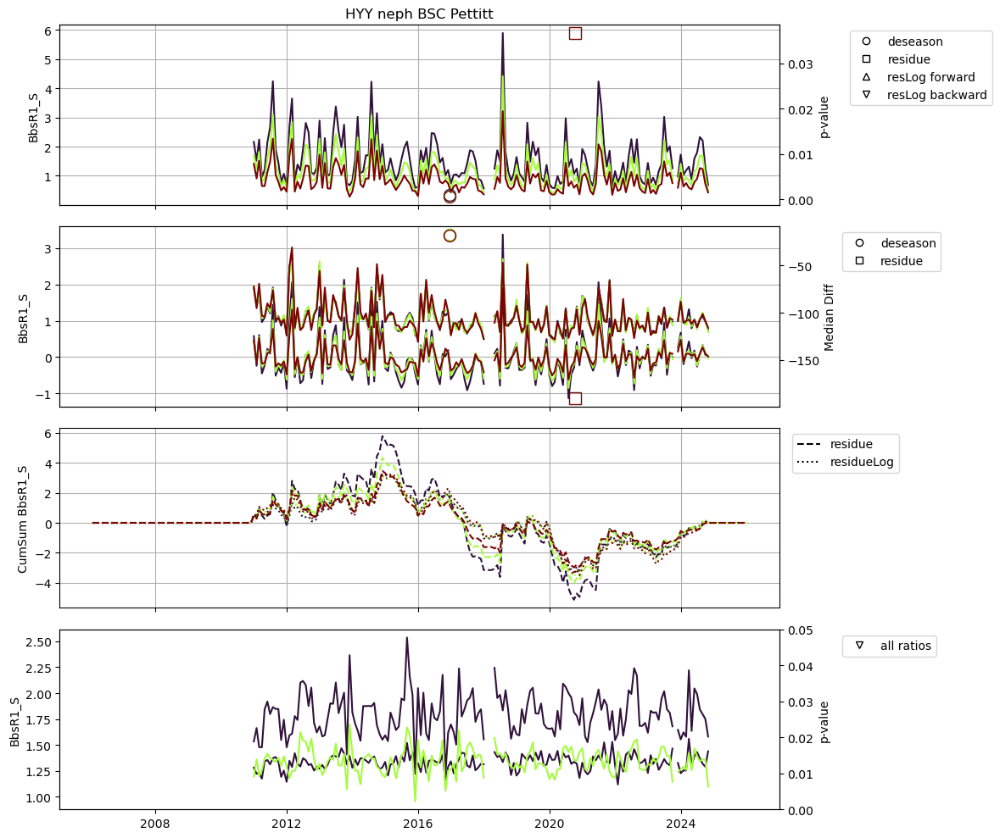

In [35]:
break_HYY_bscat = change_point_analysis_v4(HYY_rd,names_bsc[:3],0.05,'HYY','neph BSC','Pettitt')
T_HYY_bscat = make_table_breakpoints(break_HYY_bscat, 'Pettitt')

In [36]:
T_HYY_bscat

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BbsB1_S_deseason,2016-11-30,0.001049,0.000600,1.0,-13.634208,-17.568330,-30.510038
1,BbsG1_S_deseason,2016-11-30,0.000655,0.000300,1.0,-20.850228,-17.181480,-27.013270
2,BbsR1_S_deseason,2016-11-30,0.000621,0.000600,1.0,-24.697155,-18.603485,-34.855923
3,BbsR1_S_residue,2020-09-30,0.036695,0.027997,1.0,-58.865246,-190.588222,-26.289293


##### absorption

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

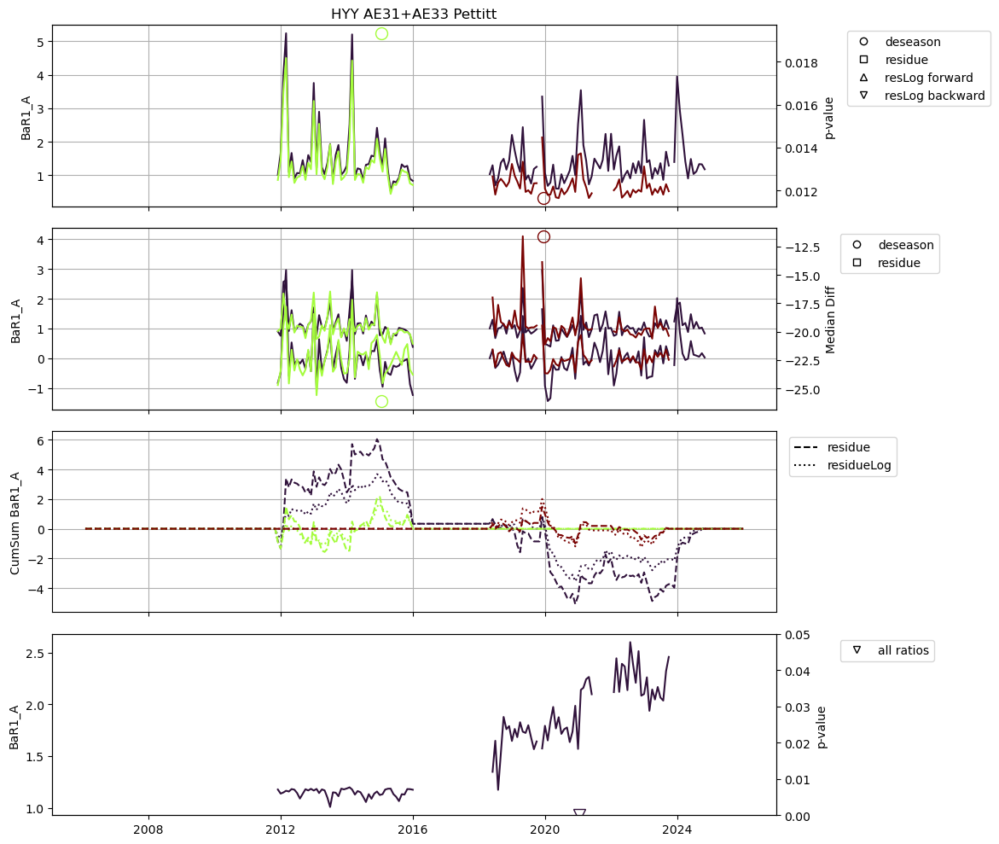

In [17]:
break_HYY_abs = change_point_analysis_v4(HYY_rd,names_aec[3:],0.05,'HYY','AE31+AE33','Pettitt')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'Pettitt')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

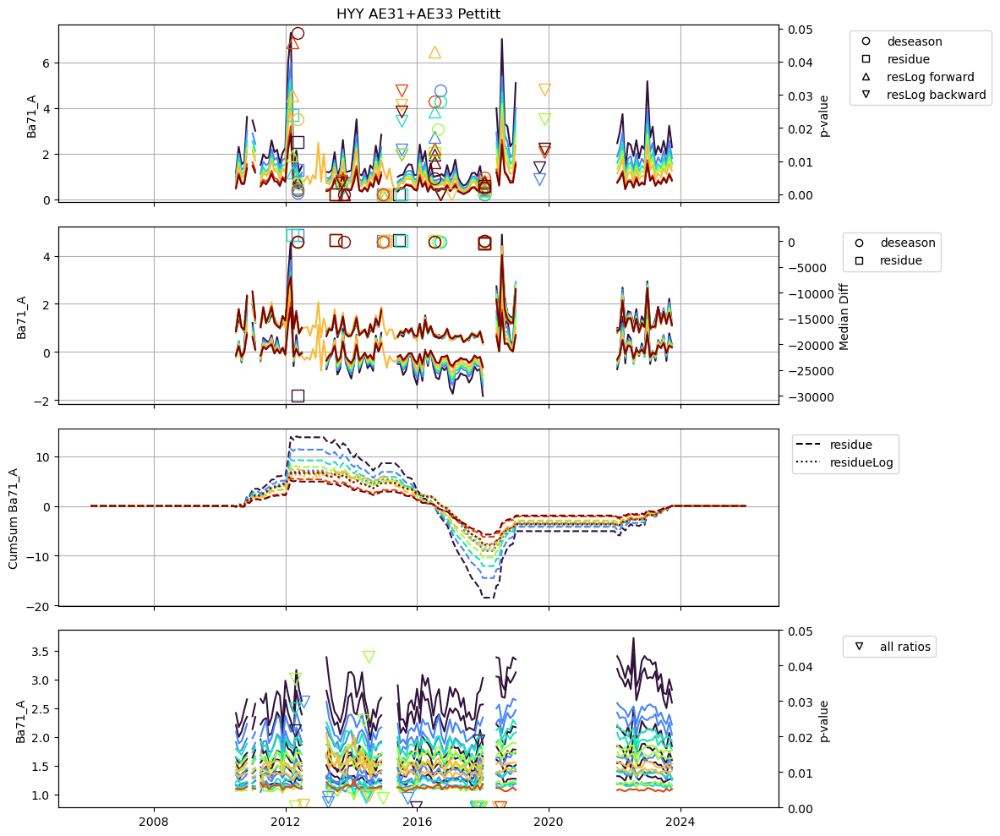

In [18]:
var=['Ba11_A','Ba21_A','Ba31_A','Ba41_A','Ba51_A','Ba61_A','Ba71_A']
break_HYY_abs = change_point_analysis_v4(HYY_rd,var,0.05,'HYY','AE31+AE33','Pettitt')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'Pettitt')

#### PM10

##### scattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

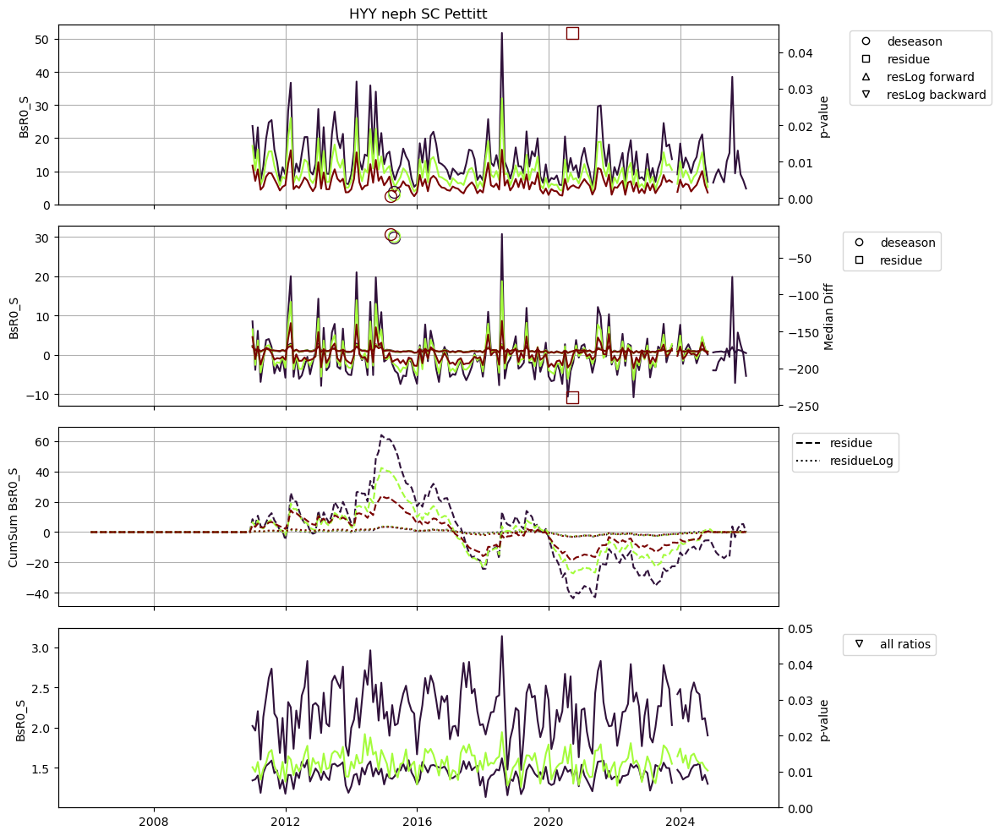

In [39]:
break_HYY_scat = change_point_analysis_v4(HYY_rd,names_sc[3:6],0.05,'HYY','neph SC', 'Pettitt')
T_HYY_scat = make_table_breakpoints(break_HYY_scat, 'Pettitt')

In [40]:
T_HYY_scat

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BsR0_S_deseason,2015-02-28,0.000503,0.000300,1.0,-33.696241,-18.319816,-41.441038
1,BsB0_S_deseason,2015-03-31,0.001690,0.001100,1.0,-20.426580,-23.354654,-48.550095
2,BsG0_S_deseason,2015-03-31,0.000895,0.000400,1.0,-28.649669,-20.442734,-43.577978
3,BsR0_S_residue,2020-08-31,0.045260,0.033997,1.0,-40.799363,-239.106331,-21.026930


##### backscattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

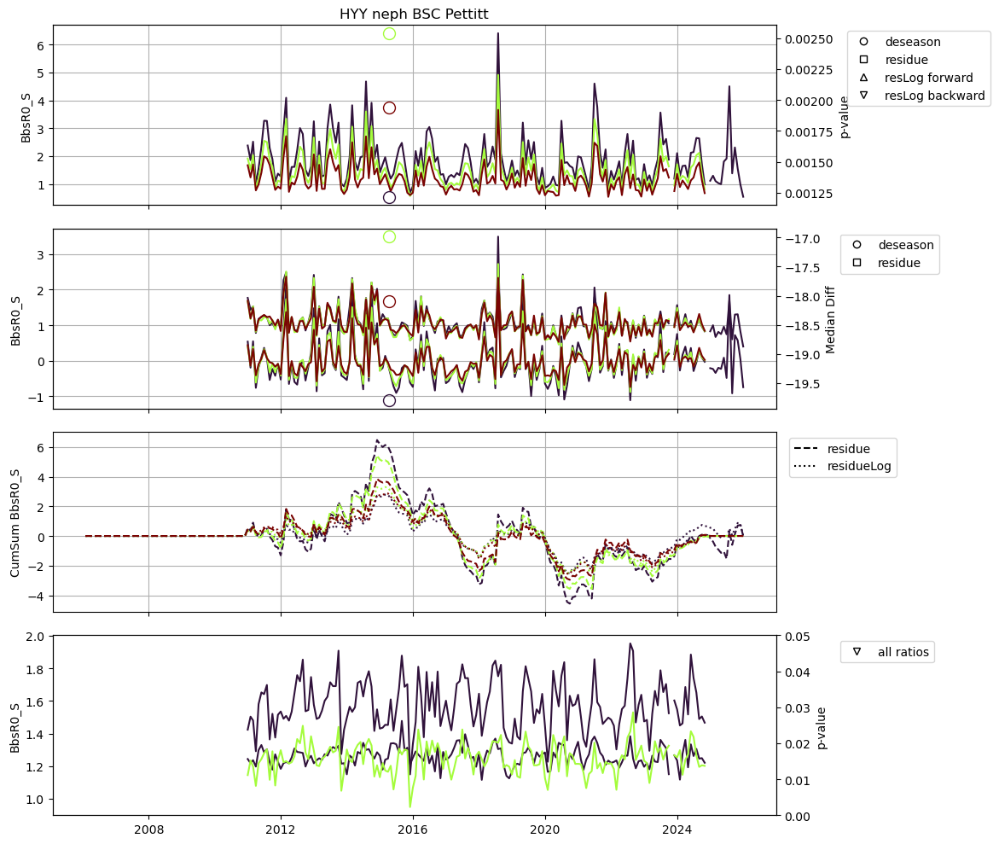

In [37]:
break_HYY_bscat = change_point_analysis_v4(HYY_rd,names_bsc[3:6],0.05,'HYY','neph BSC','Pettitt')
T_HYY_bscat = make_table_breakpoints(break_HYY_bscat, 'Pettitt')

In [38]:
T_HYY_bscat

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BbsB0_S_deseason,2015-03-31,0.001216,0.0004,1.0,-21.885946,-19.793005,-36.411087
1,BbsG0_S_deseason,2015-03-31,0.002540,0.0015,1.0,-23.832665,-16.986094,-34.370282
2,BbsR0_S_deseason,2015-03-31,0.001936,0.0012,1.0,-19.802653,-18.099572,-36.905204


##### absorption

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

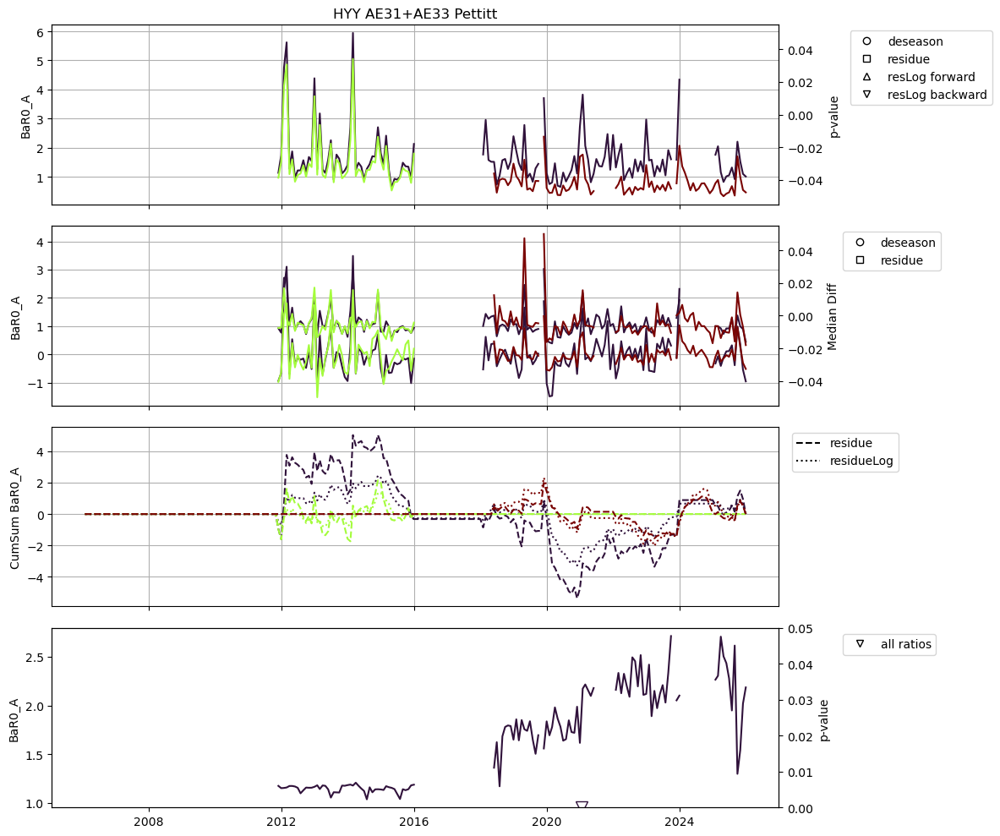

In [21]:
break_HYY_abs = change_point_analysis_v4(HYY_rd,names_aec[:3],0.05,'HYY','AE31+AE33','Pettitt')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'Pettitt')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

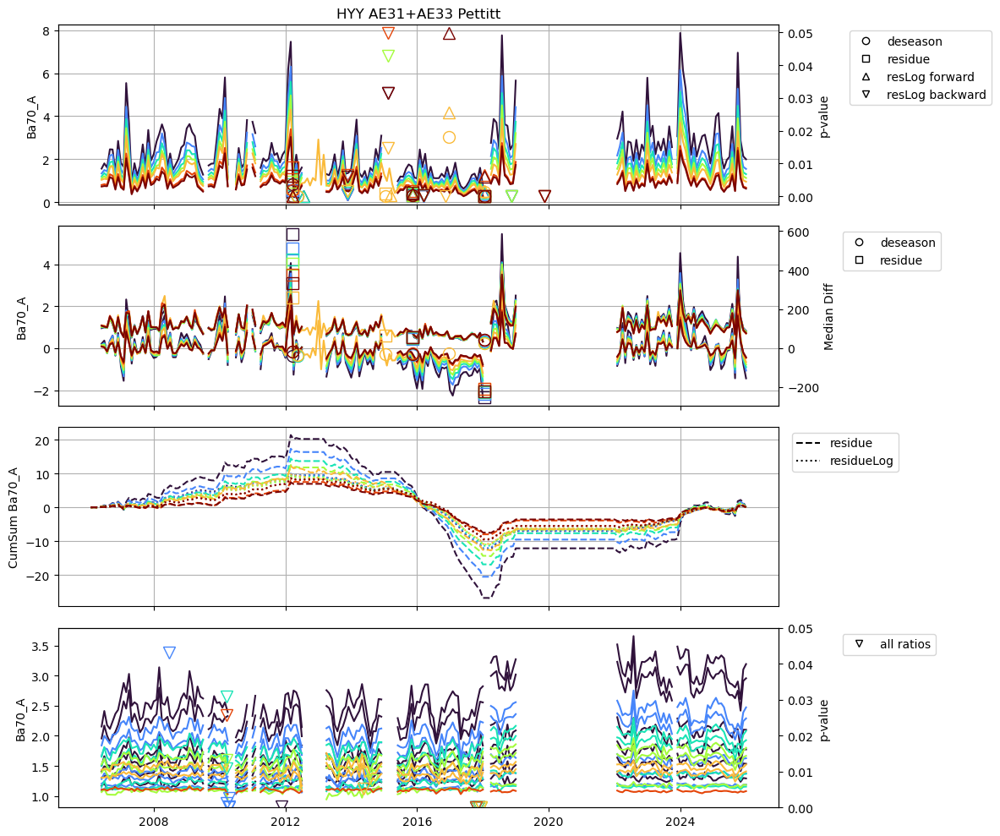

In [22]:
var=['Ba10_A','Ba20_A','Ba30_A','Ba40_A','Ba50_A','Ba60_A','Ba70_A']
break_HYY_abs = change_point_analysis_v4(HYY_rd,var,0.05,'HYY','AE31+AE33','Pettitt')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'Pettitt')

#### TSP

##### scattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

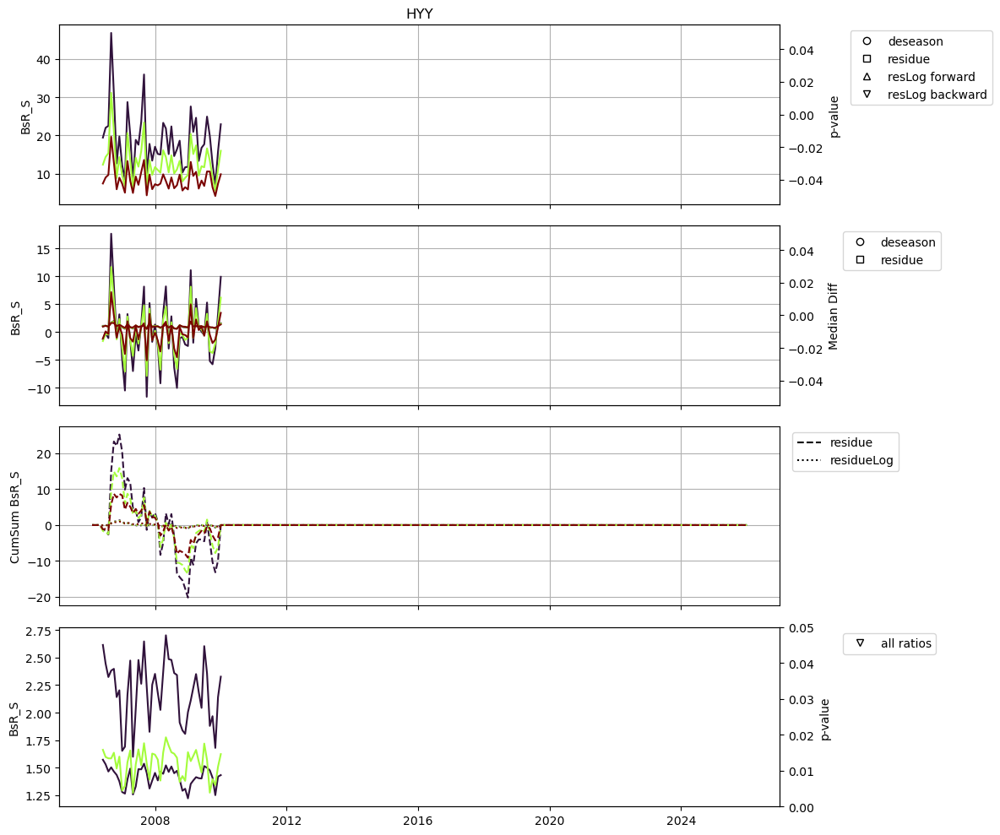

KeyError: 'Break_point'

In [91]:
break_HYY_scat = change_point_analysis_v4(HYY_rd,names_sc[6:],0.05,'HYY','neph SC', 'Pettitt')
T_HYY_scat = make_table_breakpoints(break_HYY_scat, 'Pettitt')

##### backscattering

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

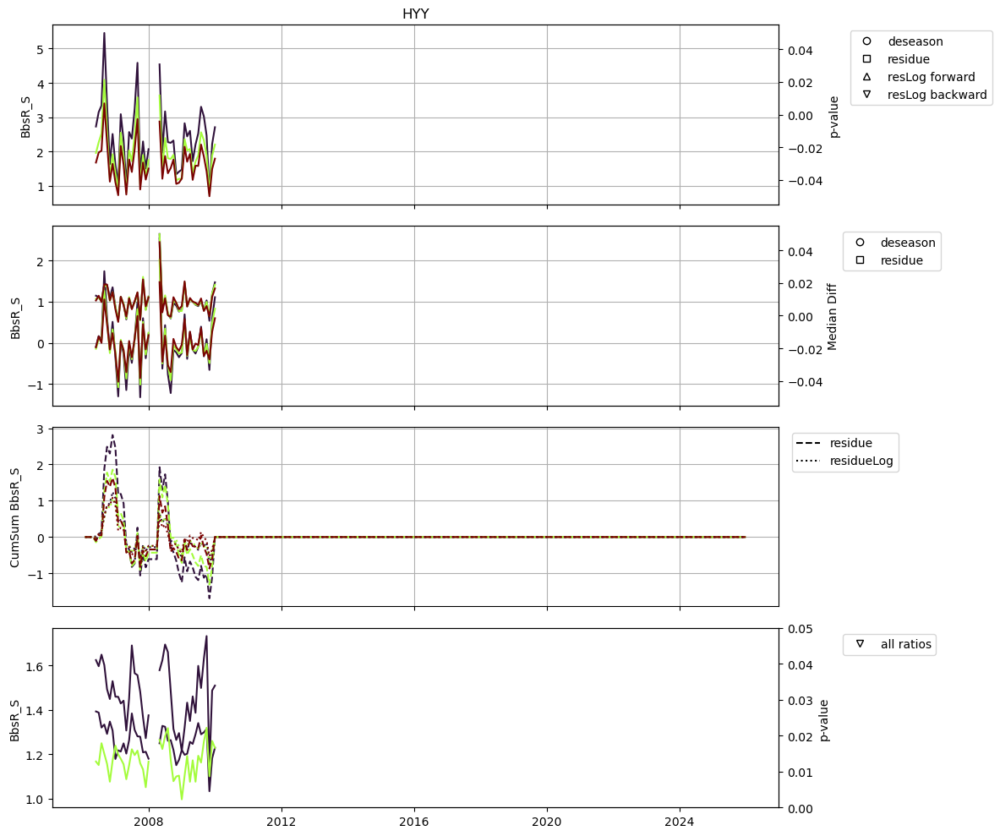

KeyError: 'Break_point'

In [92]:
break_HYY_bscat = change_point_analysis_v4(HYY_rd,names_bsc[6:],0.05,'HYY','neph BSC','Pettitt')
T_HYY_bscat = make_table_breakpoints(break_HYY_bscat, 'Pettitt')

##### absorption

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

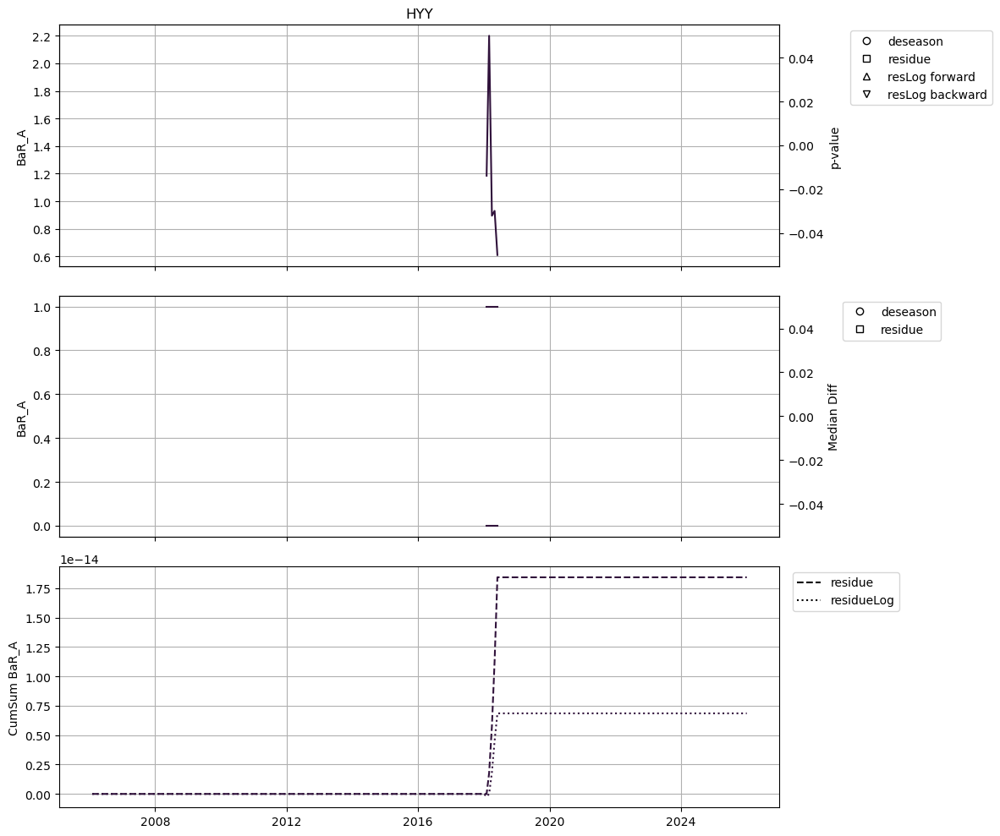

KeyError: 'Break_point'

In [93]:
break_HYY_abs = change_point_analysis_v4(HYY_rd,names_ae[-1:],0.05,'HYY','AE31+AE33','Pettitt')
T_HYY_abs = make_table_breakpoints(break_HYY_abs, 'Pettitt')

### calculs

In [3]:
lambdaSC = [450, 550, 700]
lambdaAE = [467, 530, 660]
lambdaAE7 = [370, 470, 520, 590, 660, 880, 950]

In [4]:
HYY_cal = compute_exp_ssa(HYY_rd, lambdaSC, lambdaAE)

c:\Users\ord1867\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ord1867\anaconda3\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [24]:
names_expS = [c for c in HYY_cal.columns if c.startswith("expS")]
names_expA = [c for c in HYY_cal.columns if c.startswith("expA")]
names_SSA = [c for c in HYY_cal.columns if c.startswith("SSA")]
HYY_cal.columns

Index(['BbsFG0', 'BbsFG1', 'BbsFG', 'expS_bg0', 'expS_br0', 'expS_gr0',
       'expS_bg1', 'expS_br1', 'expS_gr1', 'expS_bg3', 'expS_br3', 'expS_gr3',
       'expA_AE_bg0', 'expA_AE_br0', 'expA_AE_gr0', 'expA_fit0', 'expA_bg0',
       'expA_br0', 'expA_gr0', 'expA_AE_bg1', 'expA_AE_br1', 'expA_AE_gr1',
       'expA_fit1', 'expA_bg1', 'expA_br1', 'expA_gr1', 'SSA0BsG0_SBaR0_A',
       'SSA1BsG1_SBaR1_A', 'SSA3BsG_SBa50_A', 'SSA3BsG_SBa51_A',
       'SSA3BsG_SBaR_A'],
      dtype='object')

#### SAE

##### PM10

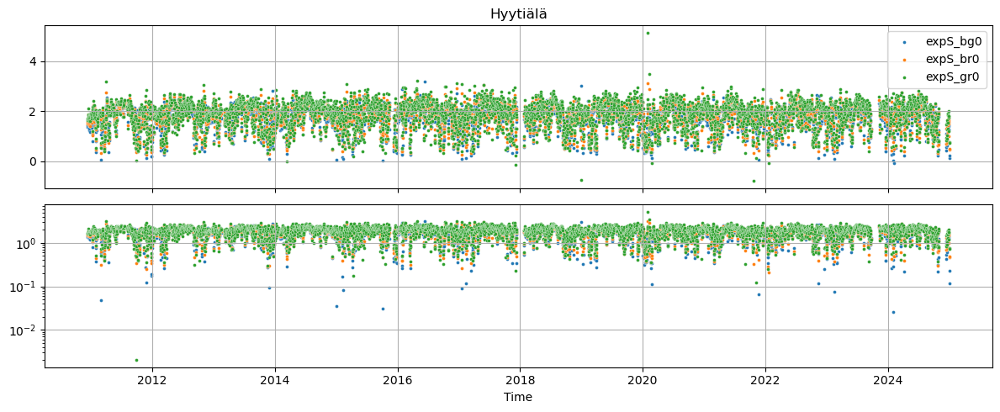

In [21]:
plotFig_var(HYY_cal, names_expS[:3],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

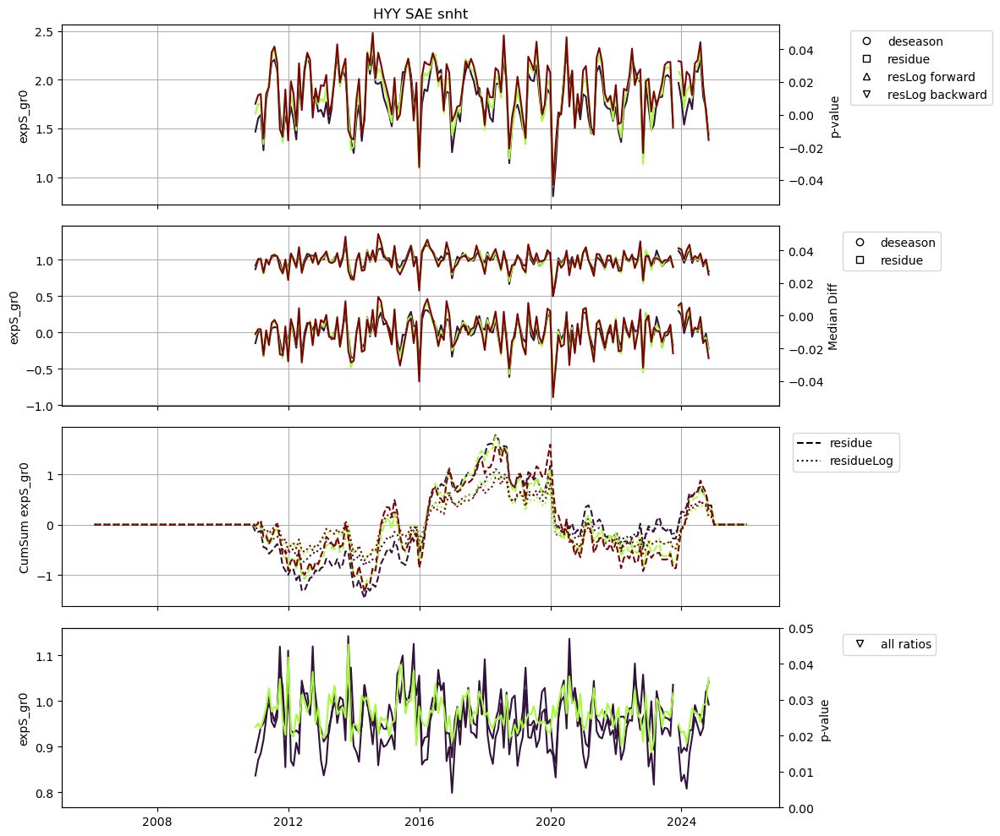

KeyError: 'Break_point'

In [66]:
break_HYY_SAE = change_point_analysis_v4(HYY_cal,names_expS[:3],0.05,'HYY','SAE', 'snht')
T_HYY_SAE = make_table_breakpoints(break_HYY_SAE, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

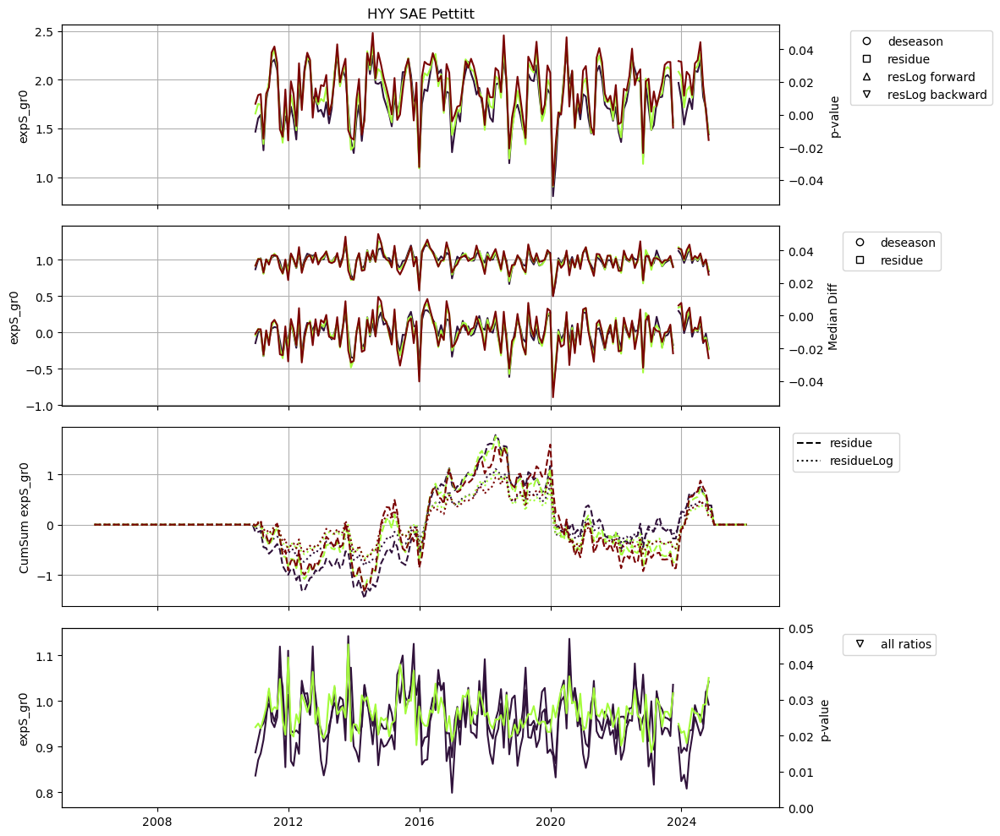

KeyError: 'Break_point'

In [68]:
break_HYY_SAE = change_point_analysis_v4(HYY_cal,names_expS[:3],0.05,'HYY','SAE', 'Pettitt')
T_HYY_SAE = make_table_breakpoints(break_HYY_SAE, 'Pettitt')

##### PM1

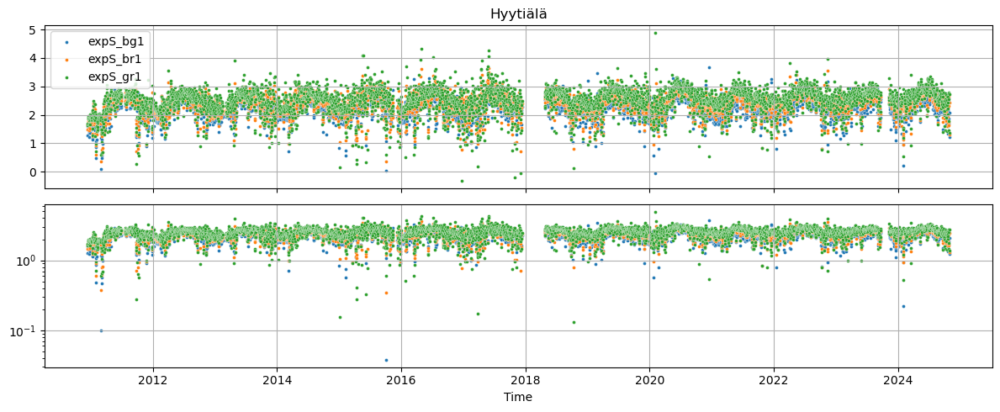

In [22]:
plotFig_var(HYY_cal, names_expS[3:6],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

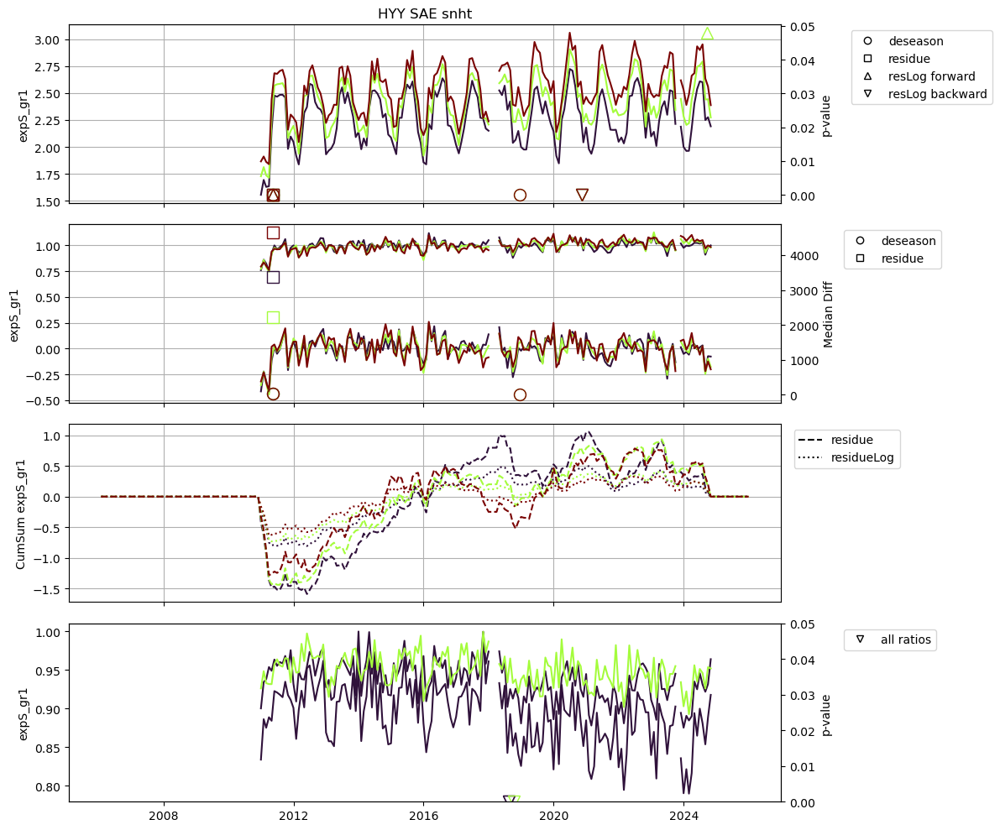

In [67]:
break_HYY_SAE = change_point_analysis_v4(HYY_cal,names_expS[3:6],0.05,'HYY','SAE', 'snht')
T_HYY_SAE = make_table_breakpoints(break_HYY_SAE, 'snht')

In [70]:
T_HYY_SAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expS_bg1_deseason,2011-04-30,0.000,1.0,19.557946,20.785470,19.202976
1,expS_bg1_residue,2011-04-30,0.000,1.0,-234.240915,3365.011286,292.135686
2,expS_bg1_residueLog,2011-04-30,0.000,1.0,-319.436745,4734.241633,324.580862
3,expS_br1_deseason,2011-04-30,0.000,1.0,20.129497,21.870866,20.181754
4,expS_gr1_residueLog,2011-04-30,0.000,1.0,-214.319494,6928.939320,339.141214
5,expS_br1_residue,2011-04-30,0.000,1.0,-243.896726,2223.046186,311.729753
6,expS_br1_residueLog,2011-04-30,0.000,1.0,-326.539245,2614.372300,381.381431
7,expS_gr1_residue,2011-04-30,0.000,1.0,-151.128103,4654.489824,307.427556
8,expS_gr1_deseason,2011-04-30,0.000,1.0,18.221197,20.104055,22.953913
9,expS_bg1_expS_br1,2018-07-31,0.000,1.0,-3.024396,-2.975851,-2.287410


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

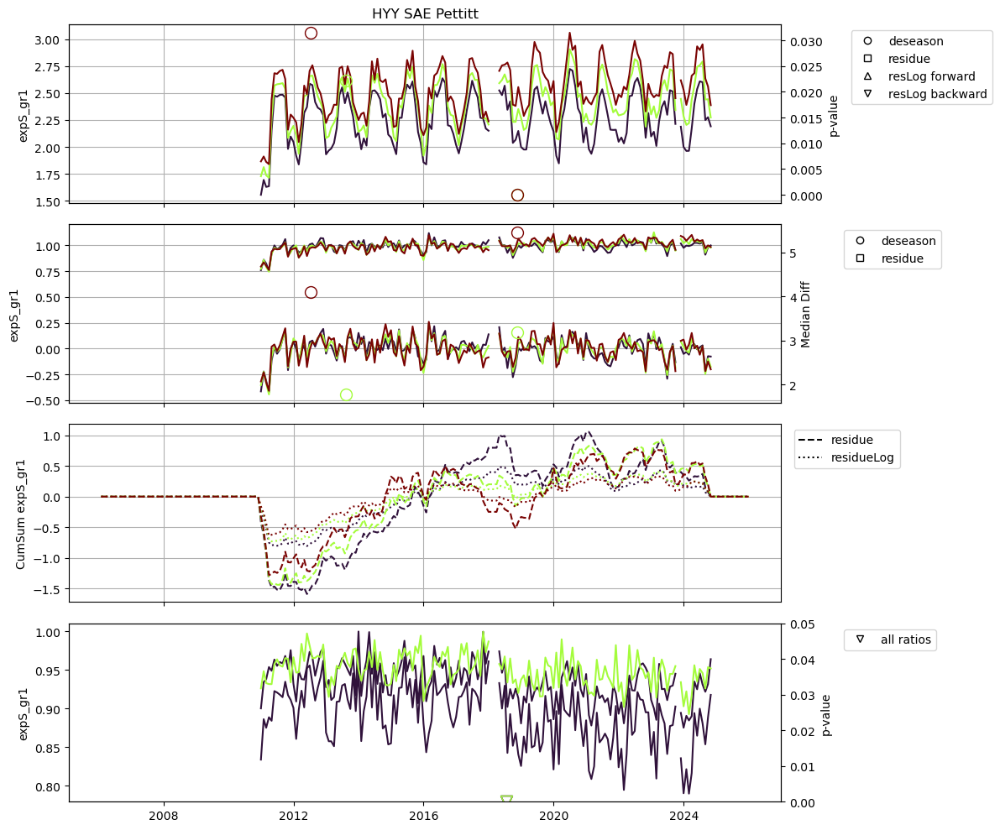

In [71]:
break_HYY_SAE = change_point_analysis_v4(HYY_cal,names_expS[3:6],0.05,'HYY','SAE', 'Pettitt')
T_HYY_SAE = make_table_breakpoints(break_HYY_SAE, 'Pettitt')

In [72]:
T_HYY_SAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expS_gr1_deseason,2012-06-30,3.149697e-02,0.022198,2.0,14.696377,4.105317,3.317711
1,expS_br1_deseason,2013-07-31,2.219229e-02,0.013599,2.0,9.948959,1.777391,3.567913
2,expS_bg1_expS_br1,2018-06-30,4.376572e-11,0.000100,1.0,-3.010889,-2.941447,-2.128400
3,expS_bg1_expS_gr1,2018-06-30,1.731751e-10,0.000100,1.0,-5.203831,-5.132801,-3.808481
4,expS_br1_expS_gr1,2018-06-30,7.028107e-06,0.000100,1.0,-1.474385,-1.871430,-1.662847
5,expS_br1_deseason,2018-10-31,1.773995e-07,0.000100,1.0,4.678449,3.189545,3.153590
6,expS_gr1_deseason,2018-10-31,1.197932e-11,0.000100,1.0,7.720208,5.452682,4.743399


##### TSP

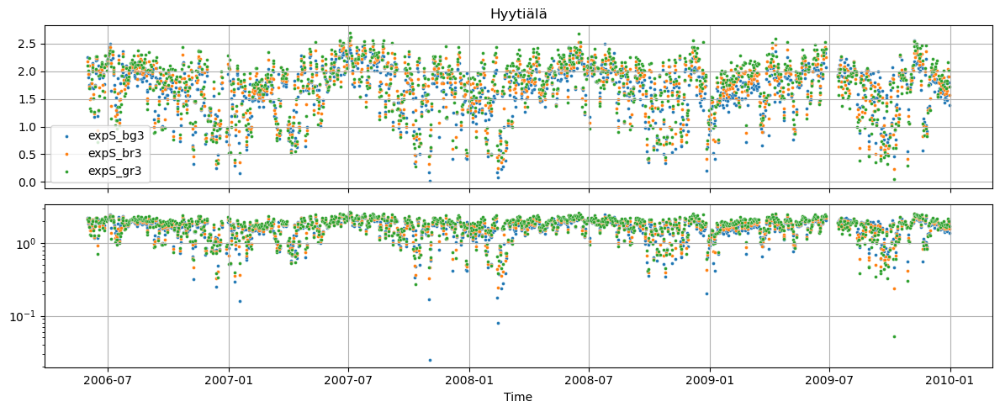

In [23]:
plotFig_var(HYY_cal, names_expS[-3:],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

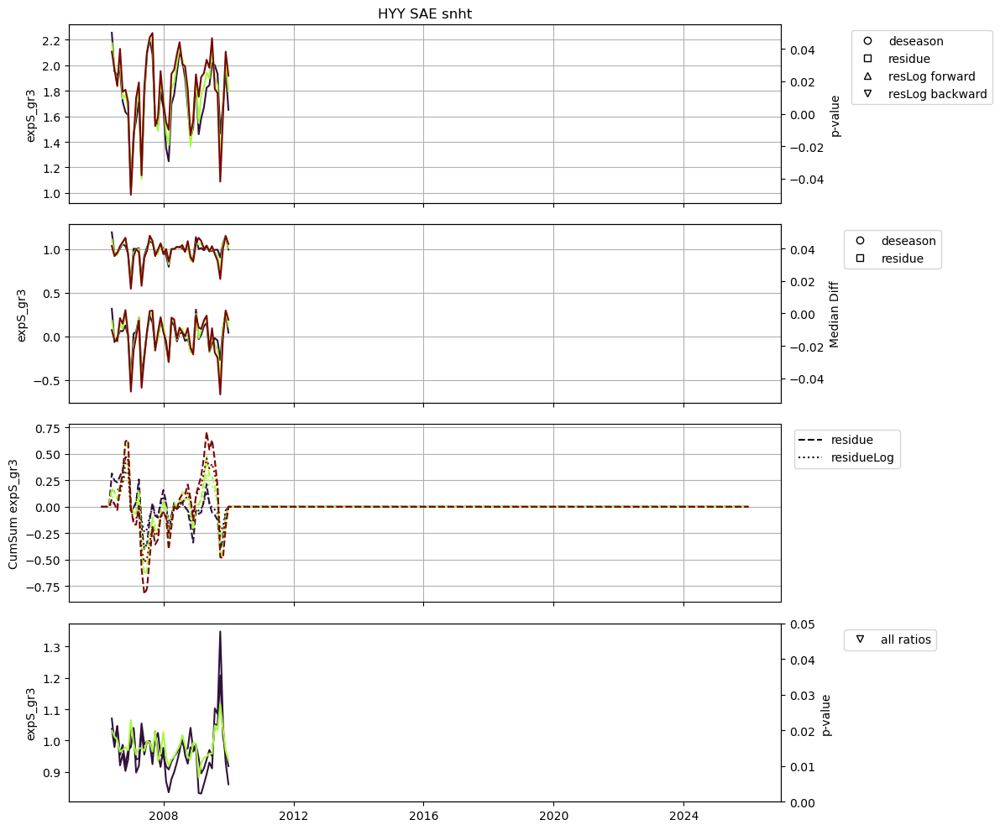

KeyError: 'Break_point'

In [73]:
break_HYY_SAE = change_point_analysis_v4(HYY_cal,names_expS[-3:],0.05,'HYY','SAE', 'snht')
T_HYY_SAE = make_table_breakpoints(break_HYY_SAE, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

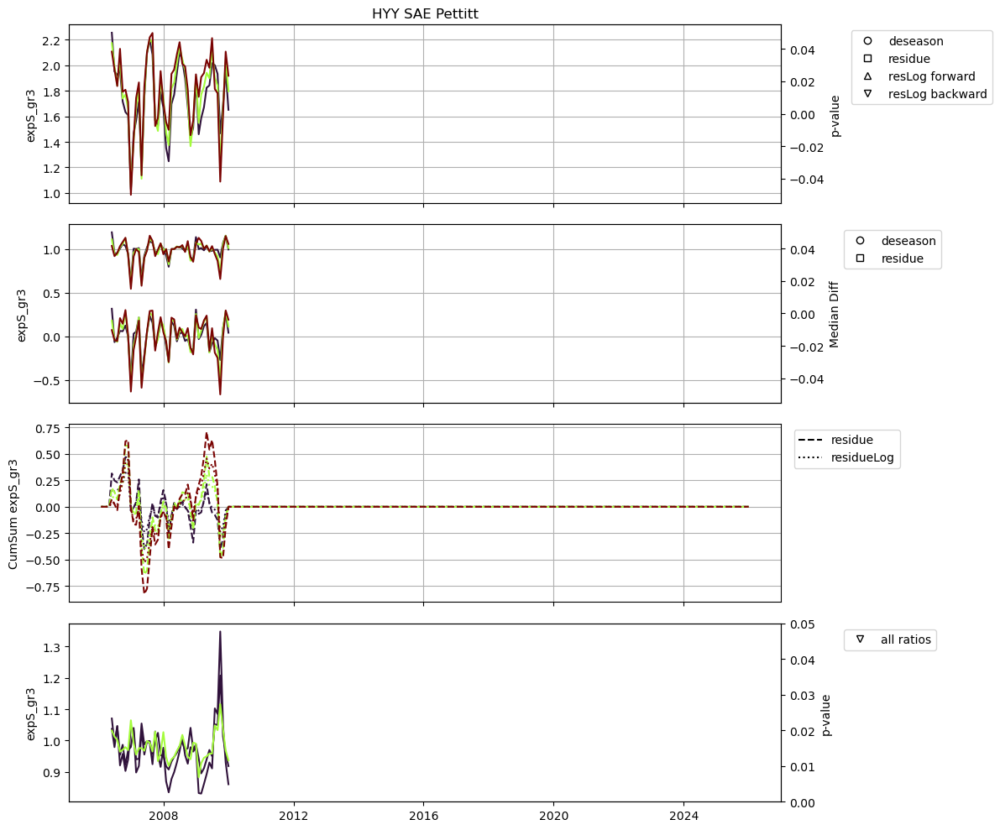

KeyError: 'Break_point'

In [74]:
break_HYY_SAE = change_point_analysis_v4(HYY_cal,names_expS[-3:],0.05,'HYY','SAE', 'Pettitt')
T_HYY_SAE = make_table_breakpoints(break_HYY_SAE, 'Pettitt')

#### SSA

##### PM10

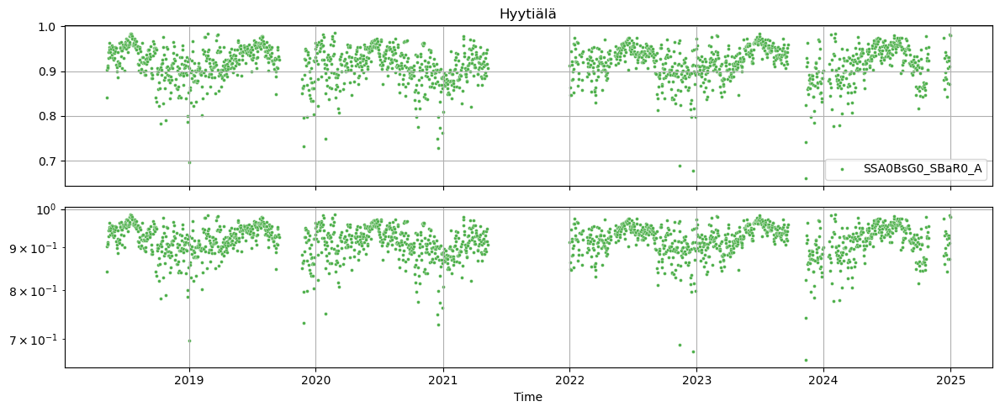

In [41]:
plotFig_var(HYY_cal, names_SSA[:1],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

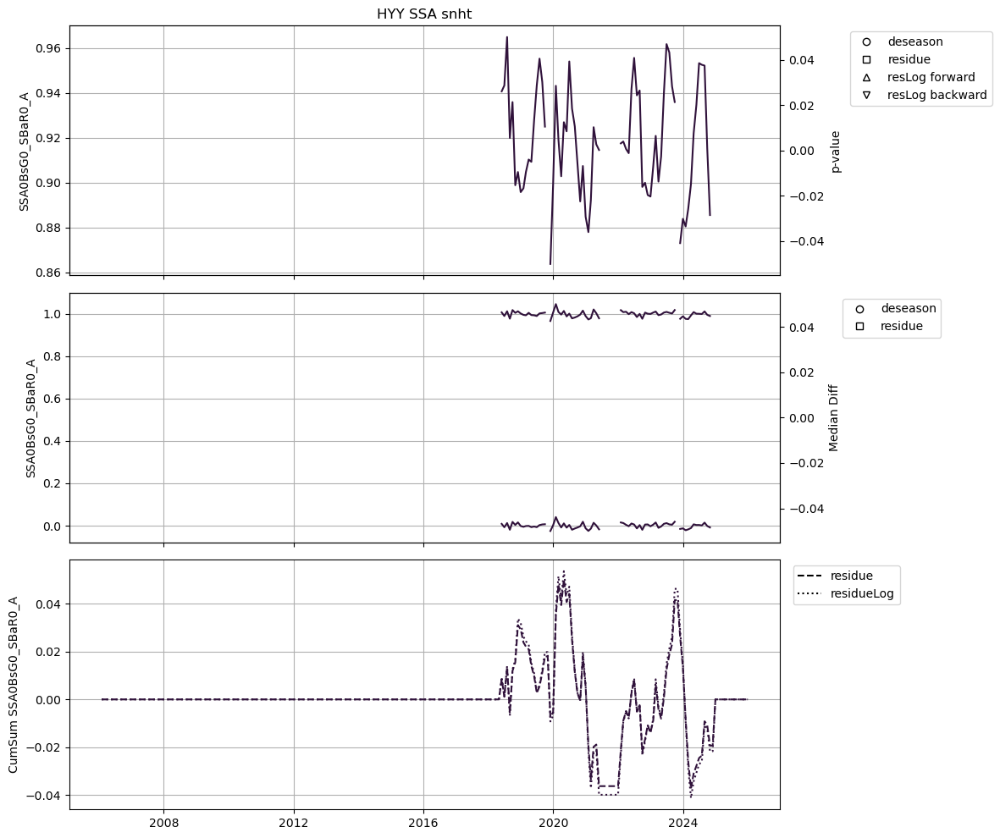

KeyError: 'Break_point'

In [75]:
break_HYY_SSA = change_point_analysis_v4(HYY_cal,names_SSA[:1],0.05,'HYY','SSA', 'snht')
T_HYY_SSA = make_table_breakpoints(break_HYY_SSA, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

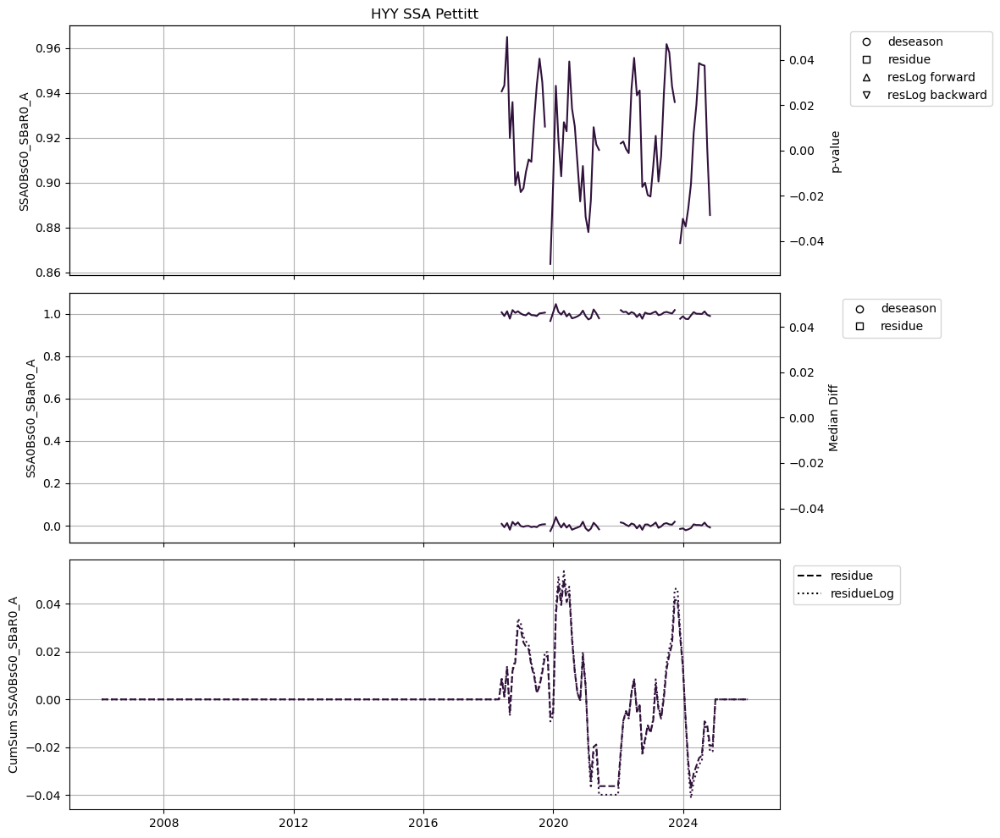

KeyError: 'Break_point'

In [77]:
break_HYY_SSA = change_point_analysis_v4(HYY_cal,names_SSA[:1],0.05,'HYY','SSA', 'Pettitt')
T_HYY_SSA = make_table_breakpoints(break_HYY_SSA, 'Pettitt')

##### PM1

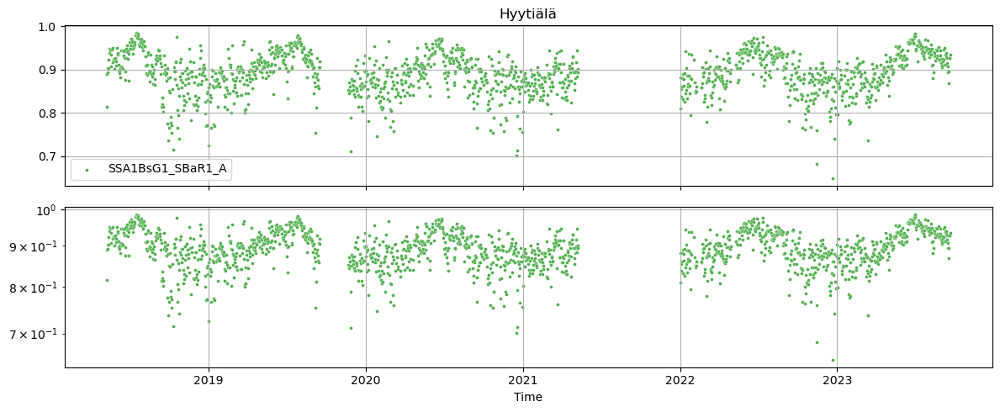

In [28]:
plotFig_var(HYY_cal, names_SSA[1:2],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

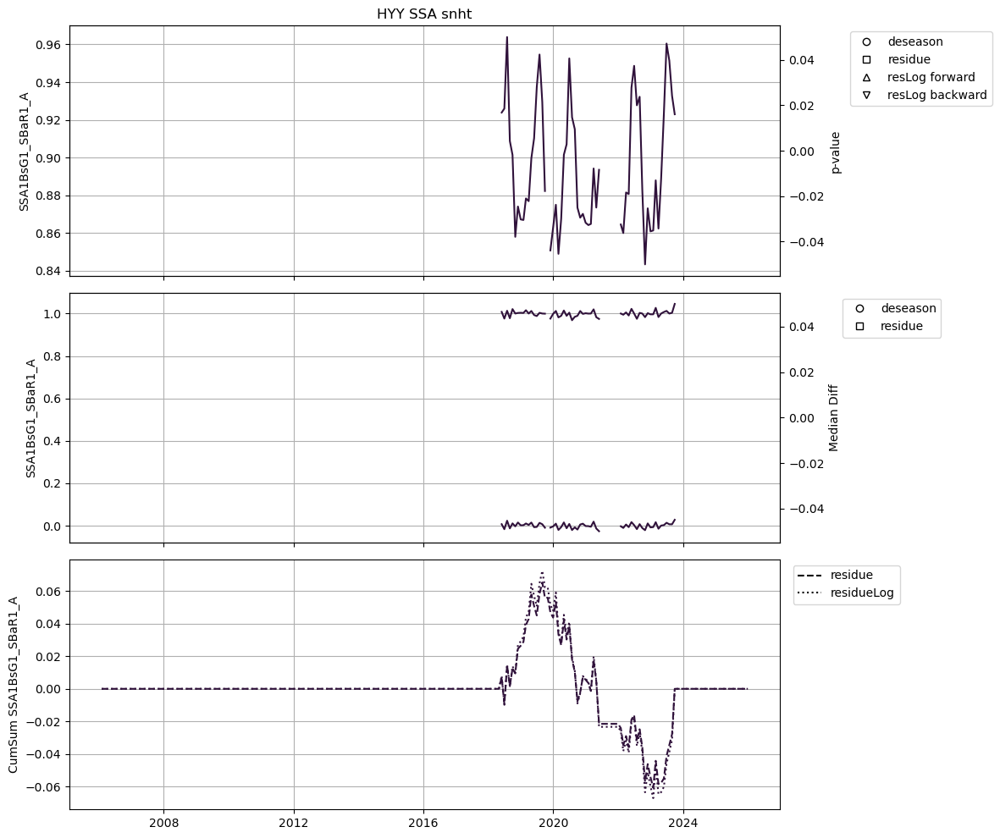

KeyError: 'Break_point'

In [78]:
break_HYY_SSA = change_point_analysis_v4(HYY_cal,names_SSA[1:2],0.05,'HYY','SSA', 'snht')
T_HYY_SSA = make_table_breakpoints(break_HYY_SSA, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

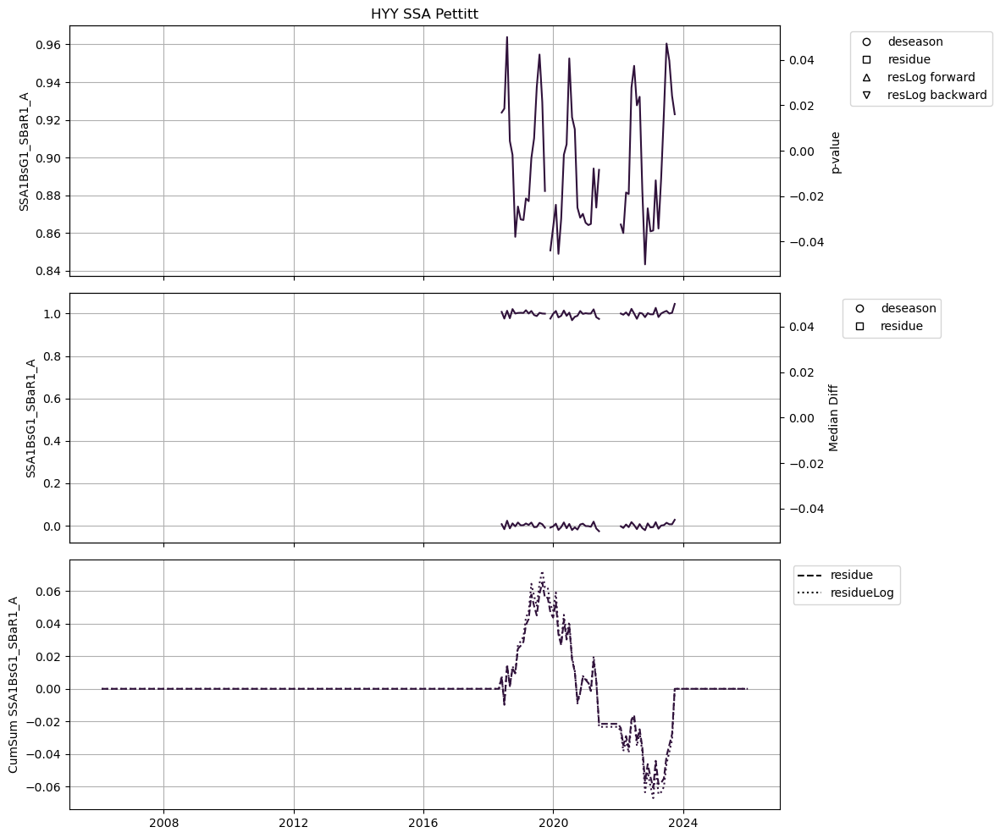

KeyError: 'Break_point'

In [79]:
break_HYY_SSA = change_point_analysis_v4(HYY_cal,names_SSA[1:2],0.05,'HYY','SSA', 'Pettitt')
T_HYY_SSA = make_table_breakpoints(break_HYY_SSA, 'Pettitt')

##### TSP

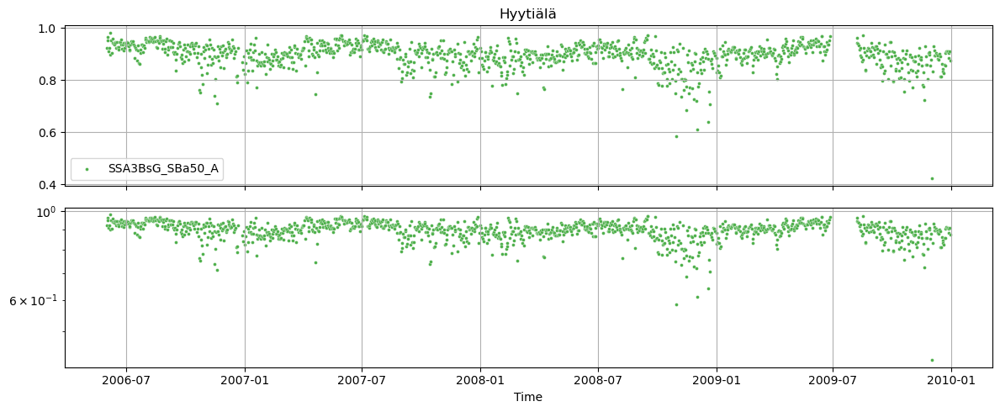

In [45]:
plotFig_var(HYY_cal, names_SSA[2:3],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

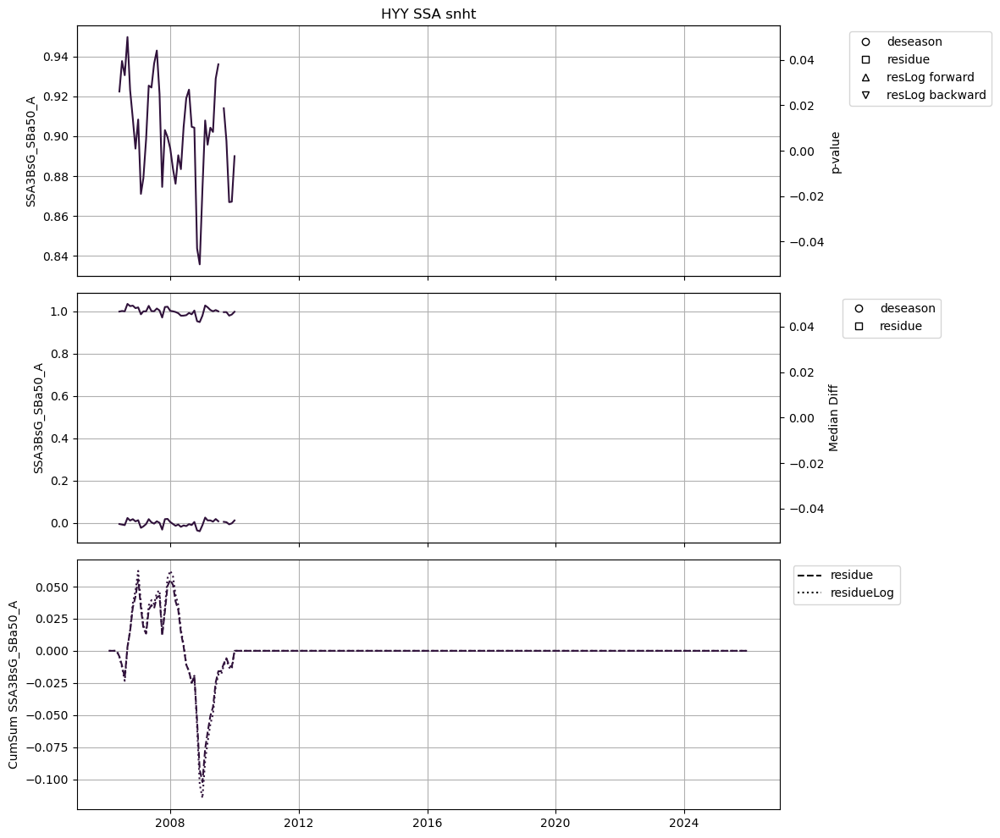

KeyError: 'Break_point'

In [80]:
break_HYY_SSA = change_point_analysis_v4(HYY_cal,names_SSA[2:3],0.05,'HYY','SSA', 'snht')
T_HYY_SSA = make_table_breakpoints(break_HYY_SSA, 'snht')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

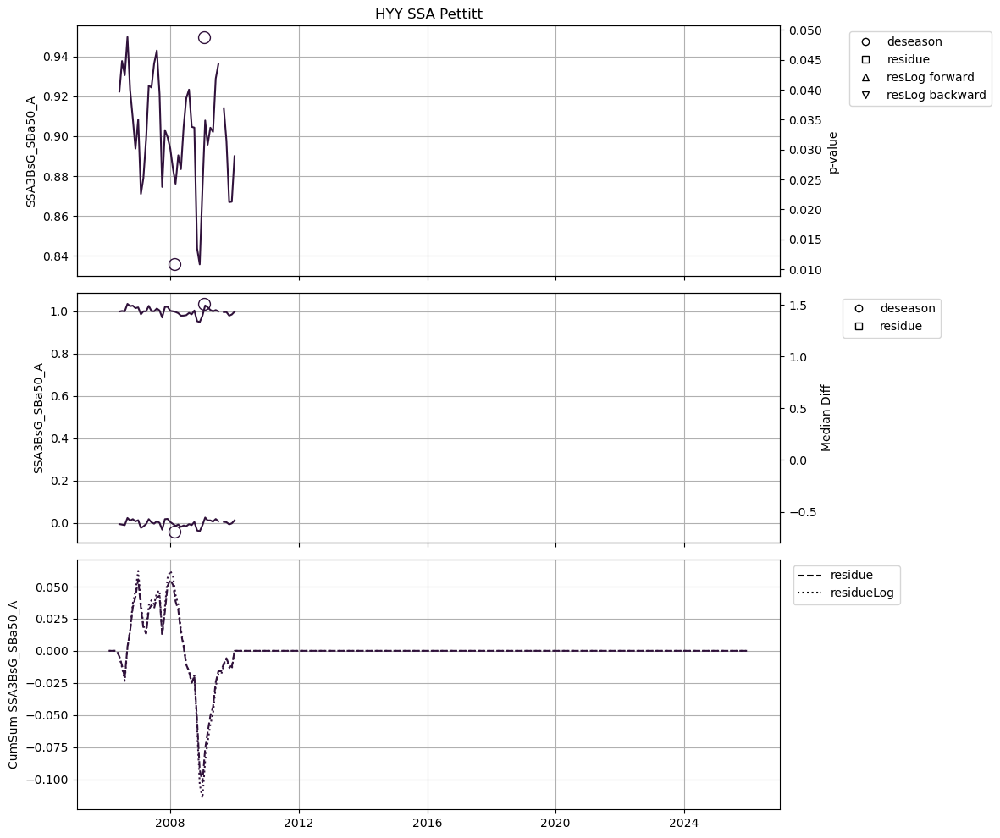

In [81]:
break_HYY_SSA = change_point_analysis_v4(HYY_cal,names_SSA[2:3],0.05,'HYY','SSA', 'Pettitt')
T_HYY_SSA = make_table_breakpoints(break_HYY_SSA, 'Pettitt')

In [82]:
T_HYY_SSA

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,SSA3BsG_SBa50_A_deseason,2008-01-31,0.010834,0.005000,1.0,-1.862848,-0.687862,-1.905683
1,SSA3BsG_SBa50_A_deseason,2008-12-31,0.048805,0.017998,2.0,2.768809,1.509128,2.017432


#### Back fraction

##### PM10

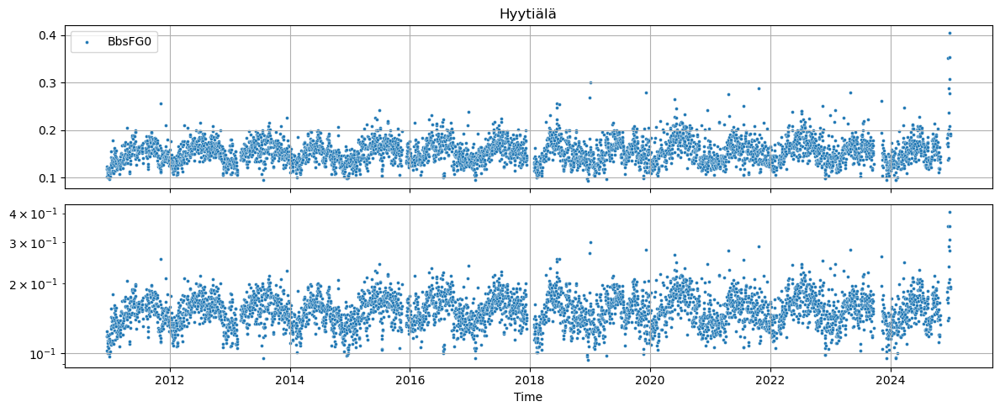

In [36]:
plotFig_var(HYY_cal, HYY_cal.columns[:1],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

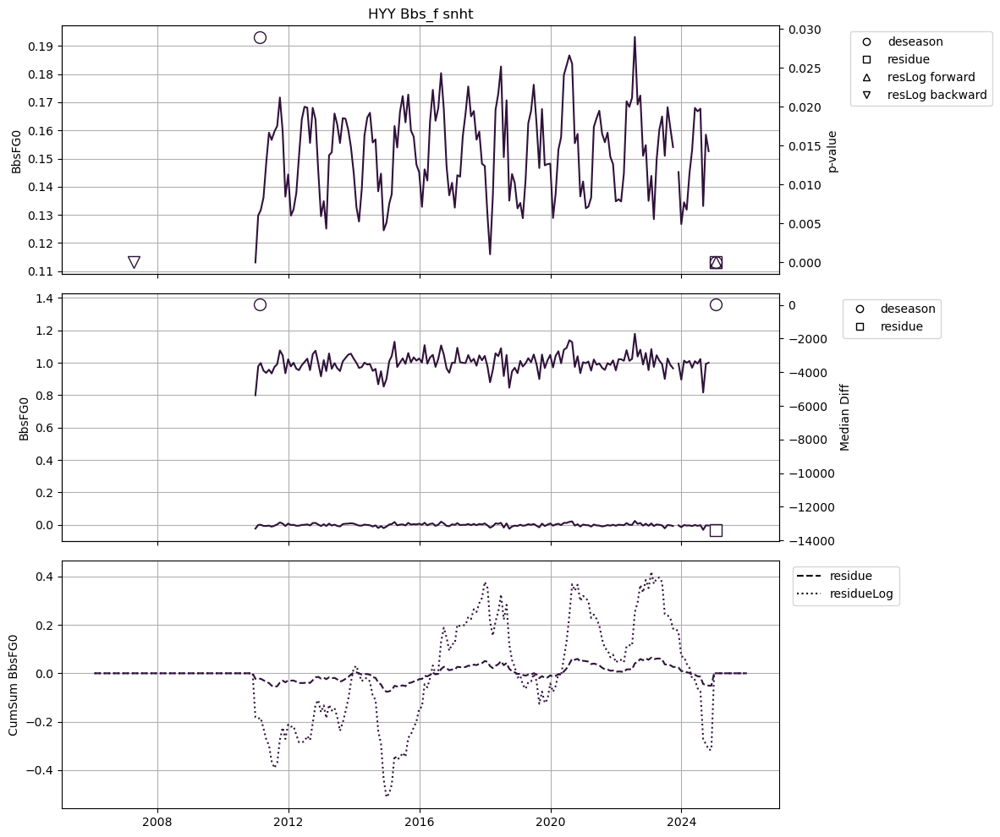

In [83]:
break_HYY_Bbs_f = change_point_analysis_v4(HYY_cal,HYY_cal.columns[:1],0.05,'HYY','Bbs_f', 'snht')
T_HYY_Bbs_f = make_table_breakpoints(break_HYY_Bbs_f, 'snht')

In [84]:
T_HYY_Bbs_f

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BbsFG0_residueLog_inv,2007-03-31,0.000,1.0,656.009032,19847.625726,-366.927457
1,BbsFG0_deseason,2011-01-31,0.029,2.0,15.133574,20.023565,24.577555
2,BbsFG0_deseason,2024-12-31,0.000,1.0,45.050991,36.052760,28.196180
3,BbsFG0_residue,2024-12-31,0.000,1.0,-636.664296,-13373.672668,403.766073
4,BbsFG0_residueLog,2024-12-31,0.000,1.0,-656.009032,-19847.625726,366.927457


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

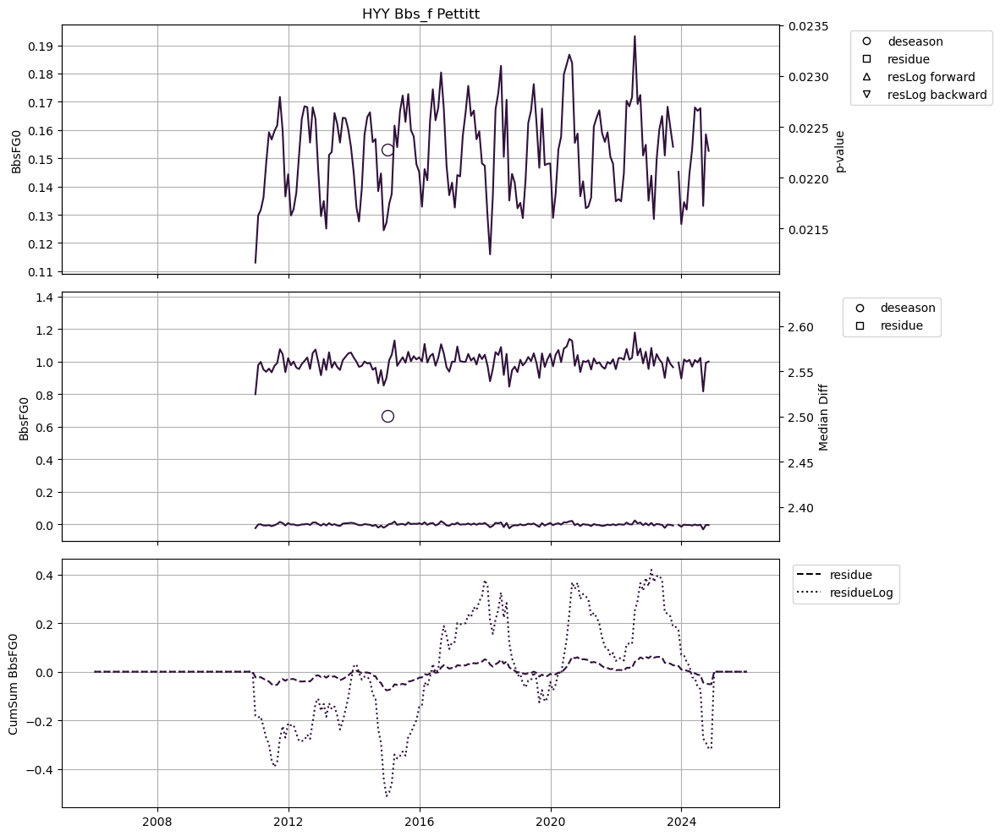

In [85]:
break_HYY_Bbs_f = change_point_analysis_v4(HYY_cal,HYY_cal.columns[:1],0.05,'HYY','Bbs_f', 'Pettitt')
T_HYY_Bbs_f = make_table_breakpoints(break_HYY_Bbs_f, 'Pettitt')

In [86]:
T_HYY_Bbs_f

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BbsFG0_deseason,2014-12-31,0.022279,0.016898,1.0,1.697059,2.500407,2.760795


##### Pm1

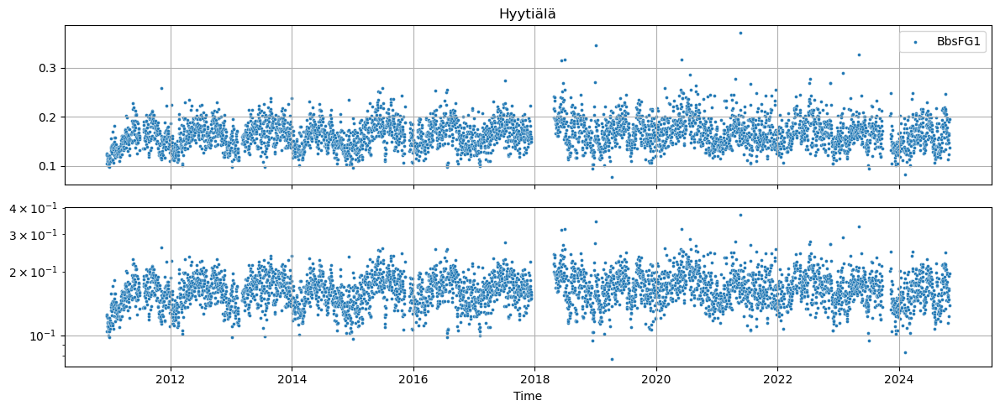

In [37]:
plotFig_var(HYY_cal, HYY_cal.columns[1:2],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

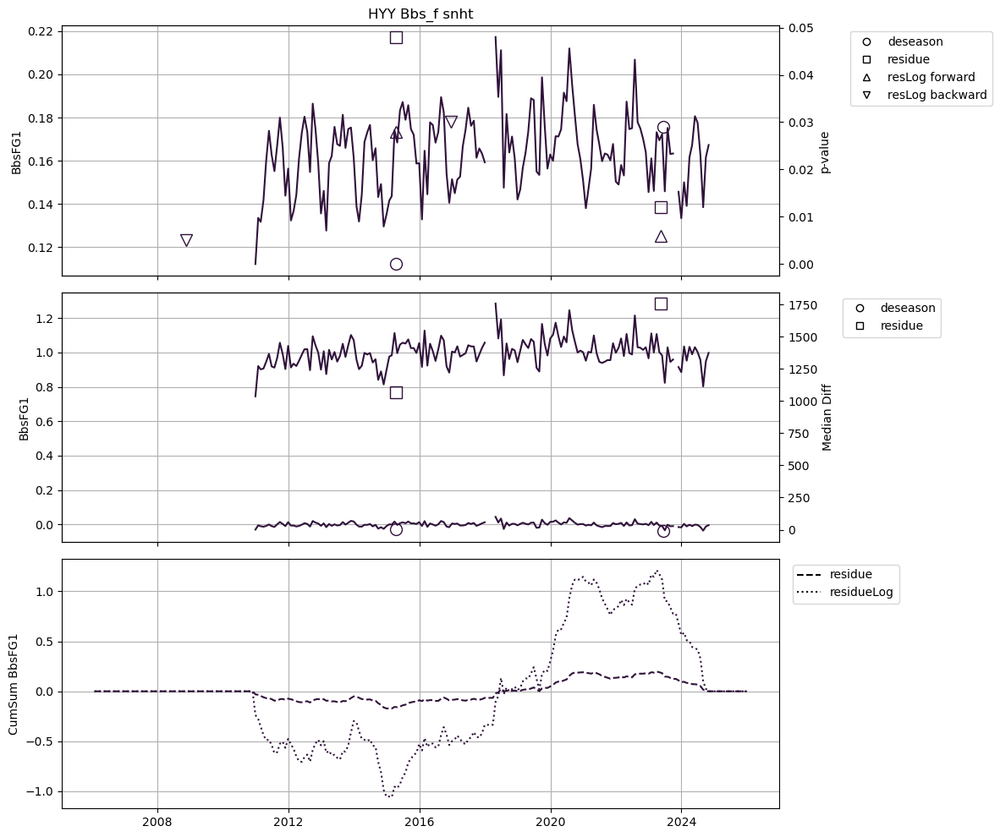

In [87]:
break_HYY_Bbs_f = change_point_analysis_v4(HYY_cal,HYY_cal.columns[1:2],0.05,'HYY','Bbs_f', 'snht')
T_HYY_Bbs_f = make_table_breakpoints(break_HYY_Bbs_f, 'snht')

In [88]:
T_HYY_Bbs_f

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BbsFG1_residueLog_inv,2008-10-31,0.005,1.0,-77.578940,-4675.130318,112.041287
1,BbsFG1_deseason,2015-03-31,0.000,1.0,4.753671,5.608970,5.959352
2,BbsFG1_residue,2015-03-31,0.048,2.0,-42.991156,1064.306385,22.508445
3,BbsFG1_residueLog,2015-03-31,0.028,2.0,-40.249858,363.928022,21.681697
4,BbsFG1_residueLog_inv,2016-11-30,0.030,2.0,39.912312,-387.847625,-21.678696
5,BbsFG1_residue,2023-04-30,0.012,1.0,70.494889,1756.429968,-117.740877
6,BbsFG1_residueLog,2023-04-30,0.006,1.0,77.578940,4675.130318,-112.041287
7,BbsFG1_deseason,2023-05-31,0.029,2.0,-9.106322,-6.580327,-6.889631


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

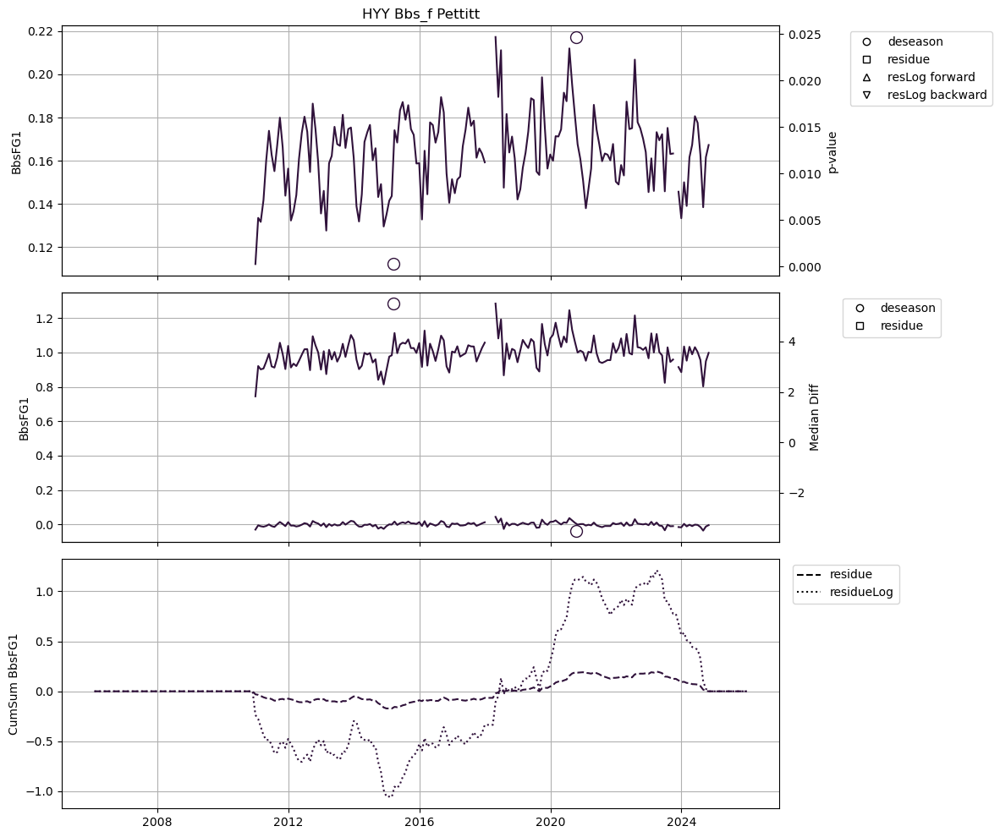

In [89]:
break_HYY_Bbs_f = change_point_analysis_v4(HYY_cal,HYY_cal.columns[1:2],0.05,'HYY','Bbs_f', 'Pettitt')
T_HYY_Bbs_f = make_table_breakpoints(break_HYY_Bbs_f, 'Pettitt')

In [90]:
T_HYY_Bbs_f

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BbsFG1_deseason,2015-02-28,0.000285,0.000300,1.0,4.876035,5.507096,5.841048
1,BbsFG1_deseason,2020-09-30,0.024671,0.019598,2.0,1.754587,-3.499668,-3.533313


##### TSP

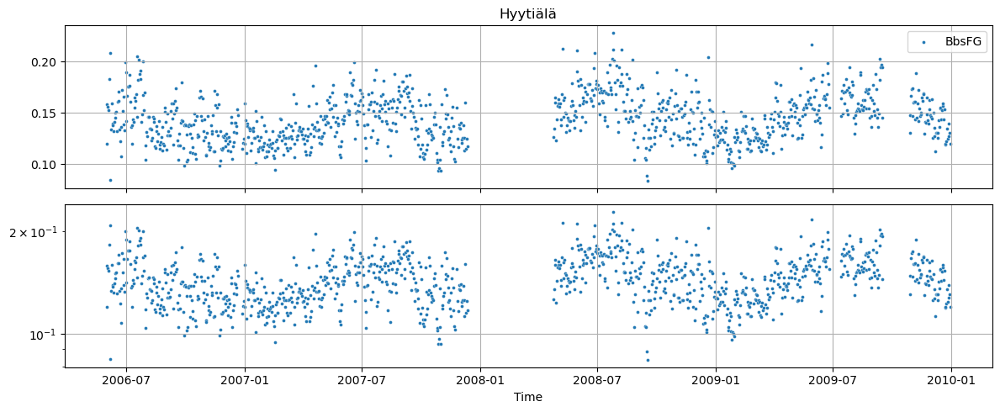

In [38]:
plotFig_var(HYY_cal, HYY_cal.columns[2:3],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

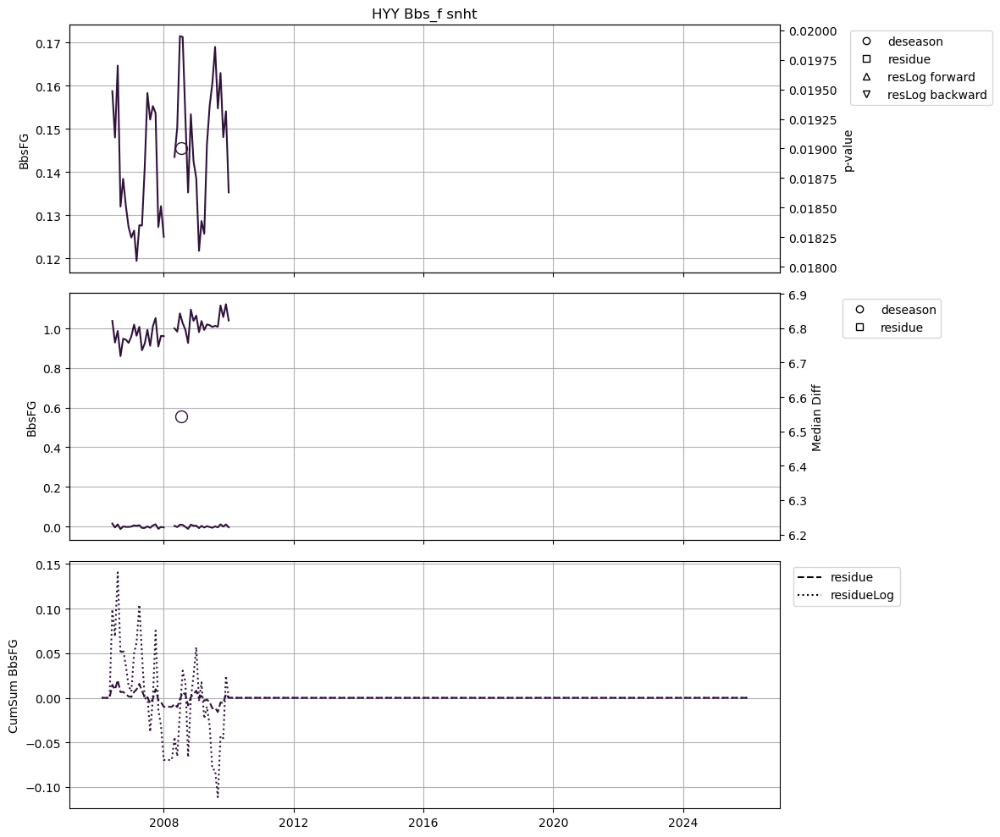

In [91]:
break_HYY_Bbs_f = change_point_analysis_v4(HYY_cal,HYY_cal.columns[2:3],0.05,'HYY','Bbs_f', 'snht')
T_HYY_Bbs_f = make_table_breakpoints(break_HYY_Bbs_f, 'snht')

In [92]:
T_HYY_Bbs_f

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,BbsFG_deseason,2008-06-30,0.019,1.0,8.749789,6.54276,7.598027


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

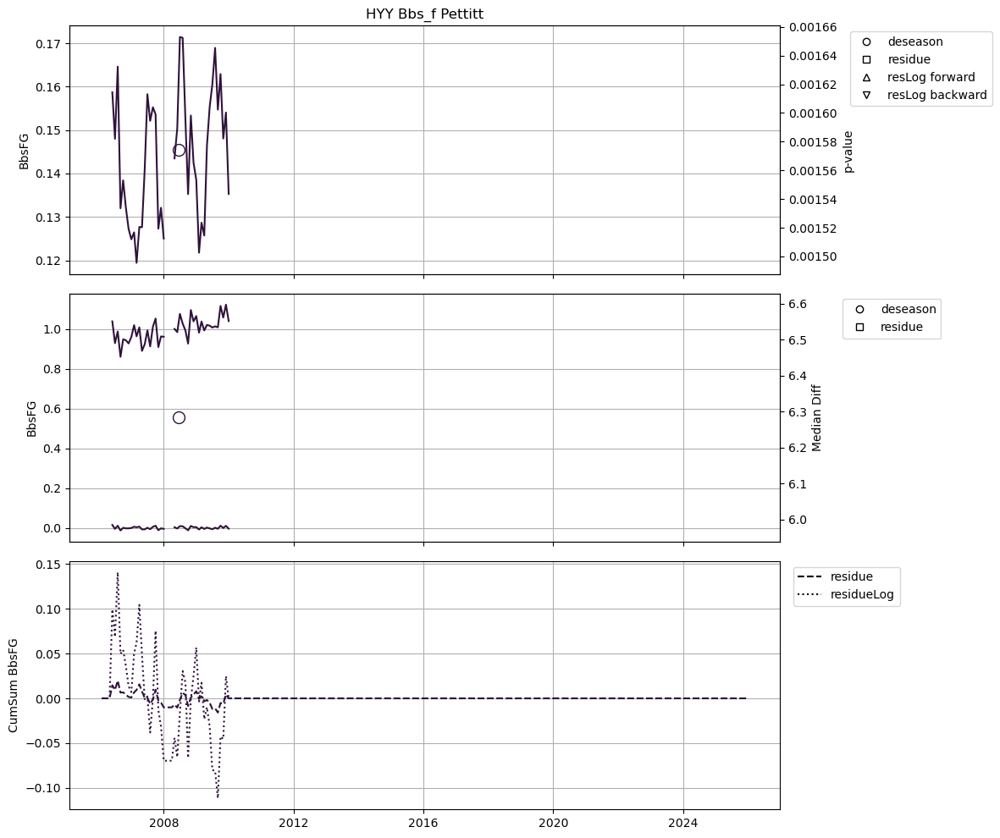

In [93]:
break_HYY_Bbs_f = change_point_analysis_v4(HYY_cal,HYY_cal.columns[2:3],0.05,'HYY','Bbs_f', 'Pettitt')
T_HYY_Bbs_f = make_table_breakpoints(break_HYY_Bbs_f, 'Pettitt')

In [95]:
T_HYY_Bbs_f

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,BbsFG_deseason,2008-05-31,0.001574,0.0002,1.0,8.101359,6.283563,7.333982


#### AAE

##### PM10

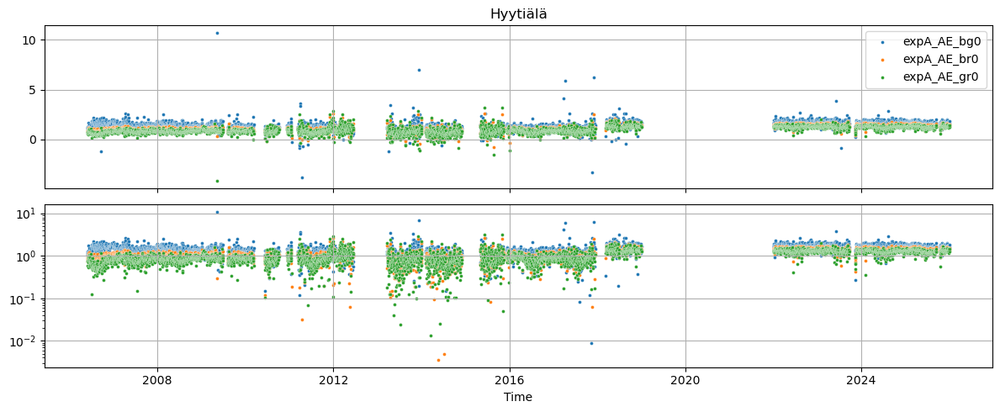

In [52]:
plotFig_var(HYY_cal, names_expA[:3],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

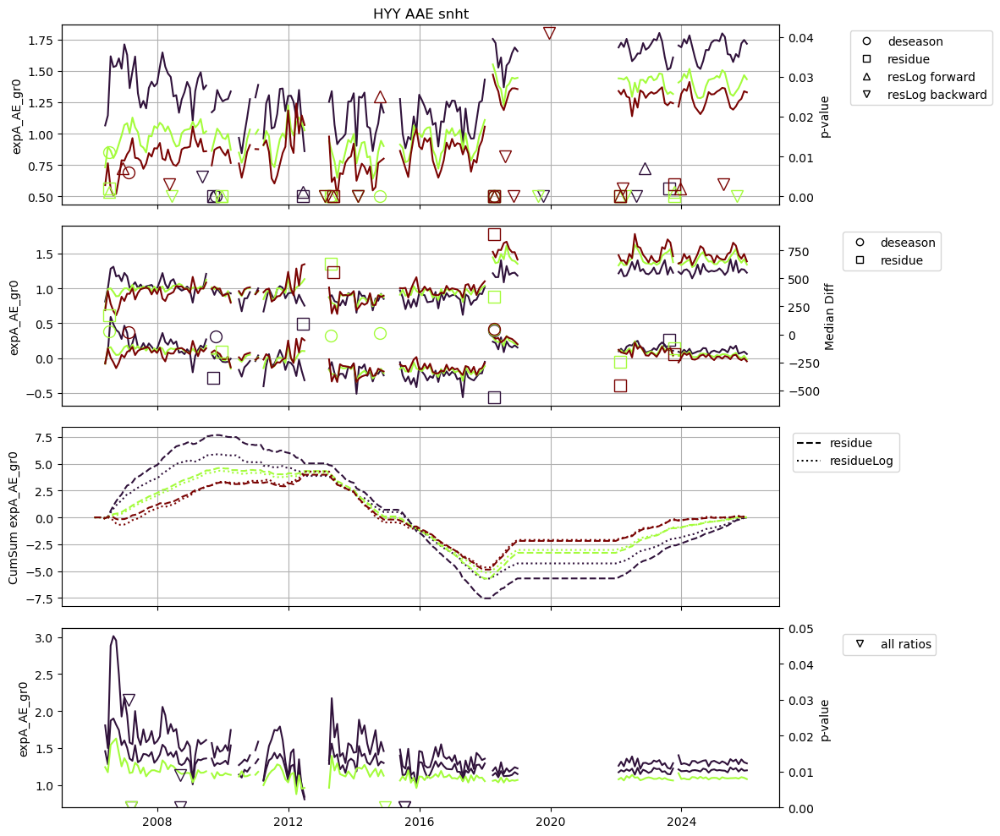

In [96]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[:3],0.05,'HYY','AAE', 'snht')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'snht')

In [97]:
T_HYY_AAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expA_AE_br0_deseason,2006-06-30,0.011,3.0,18.356326,27.143900,30.262843
1,expA_AE_br0_residueLog,2006-06-30,0.001,4.0,348.070882,224.264696,188.892740
2,expA_AE_br0_residue,2006-06-30,0.002,4.0,251.124876,171.668702,153.295364
3,expA_AE_gr0_residueLog,2006-11-30,0.007,3.0,-218.251839,294.270398,82.023578
4,expA_AE_gr0_deseason,2007-01-31,0.006,2.0,20.177295,22.690786,13.811052
...,...,...,...,...,...,...,...
59,expA_AE_gr0_residue,2023-09-30,0.003,3.0,287.679742,-175.679574,-85.359744
60,expA_AE_br0_residue,2023-09-30,0.000,3.0,-309.721239,-123.473221,-74.603702
61,expA_AE_gr0_residueLog,2023-11-30,0.002,3.0,195.465425,-191.499553,-59.802420
62,expA_AE_gr0_residueLog_inv,2025-03-31,0.003,3.0,206.559970,-280.094333,-82.094748


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

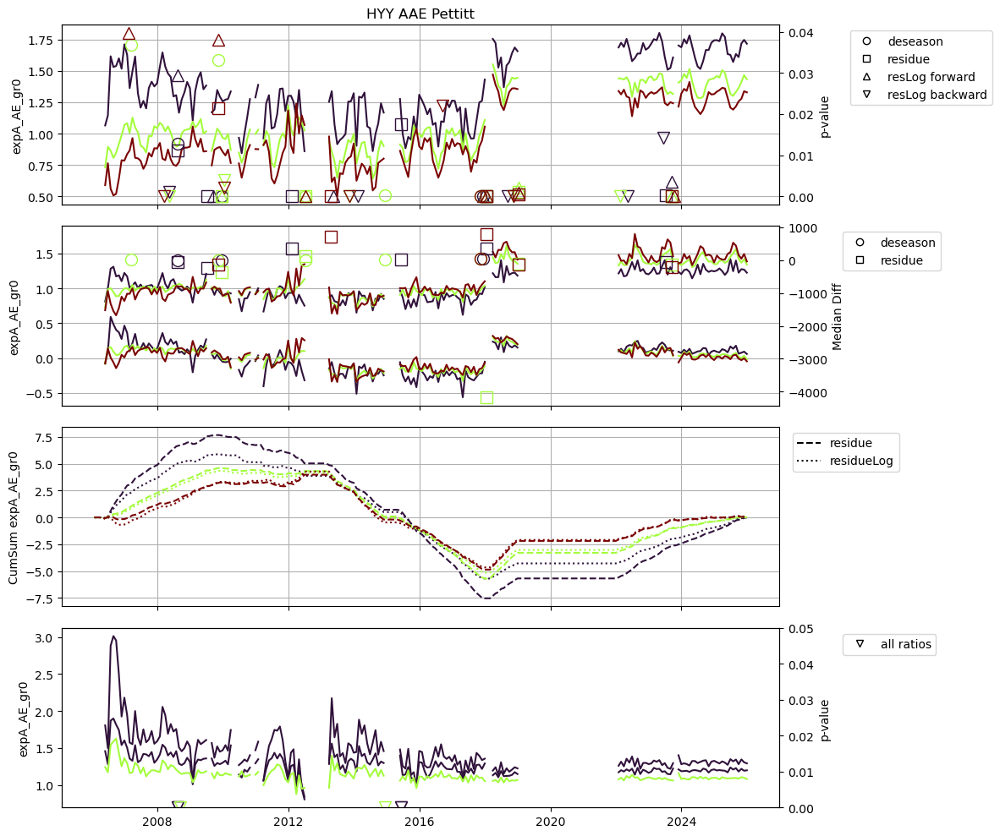

In [98]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[:3],0.05,'HYY','AAE', 'Pettitt')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'Pettitt')

In [99]:
T_HYY_AAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expA_AE_gr0_residueLog,2007-01-31,3.971729e-02,0.019298,3.0,-335.497650,209.872488,59.054266
1,expA_AE_br0_deseason,2007-02-28,3.680704e-02,0.016998,4.0,11.963087,4.943046,4.636645
2,expA_AE_gr0_residueLog_inv,2008-02-29,2.329830e-06,0.000100,3.0,-222.124334,210.251834,79.970166
3,expA_AE_bg0_residueLog_inv,2008-04-30,1.083735e-03,0.000600,3.0,49.379364,42.687563,42.059181
4,expA_AE_br0_residueLog_inv,2008-04-30,1.723468e-06,0.000100,3.0,307.767568,152.468221,70.164088
...,...,...,...,...,...,...,...,...
57,expA_AE_br0_residue,2023-08-31,2.751808e-08,0.000100,3.0,-308.621895,-136.240520,-73.740406
58,expA_AE_bg0_residueLog,2023-08-31,3.427876e-03,0.001500,3.0,-30.824972,-48.516988,-42.610644
59,expA_AE_gr0_residue,2023-08-31,1.784824e-07,0.000100,2.0,374.337561,-217.731819,-87.400367
60,expA_AE_br0_residueLog,2023-08-31,1.139064e-06,0.000100,3.0,-333.119146,-149.274821,-67.767526


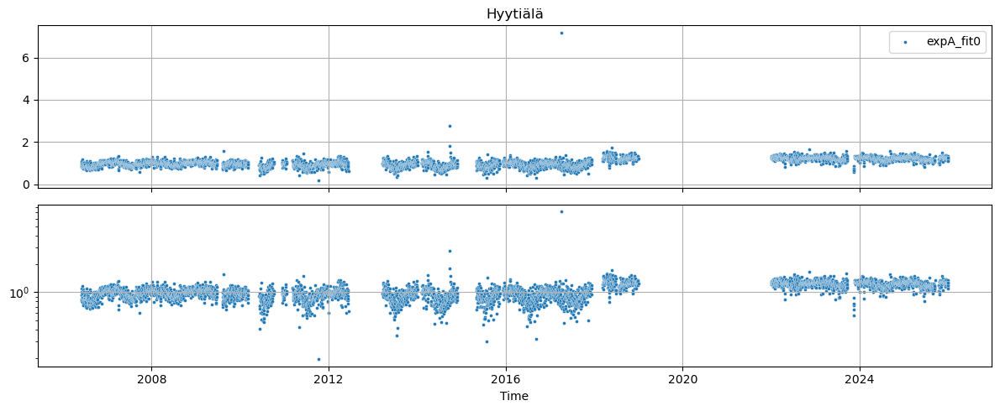

In [53]:
plotFig_var(HYY_cal, names_expA[3:4],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

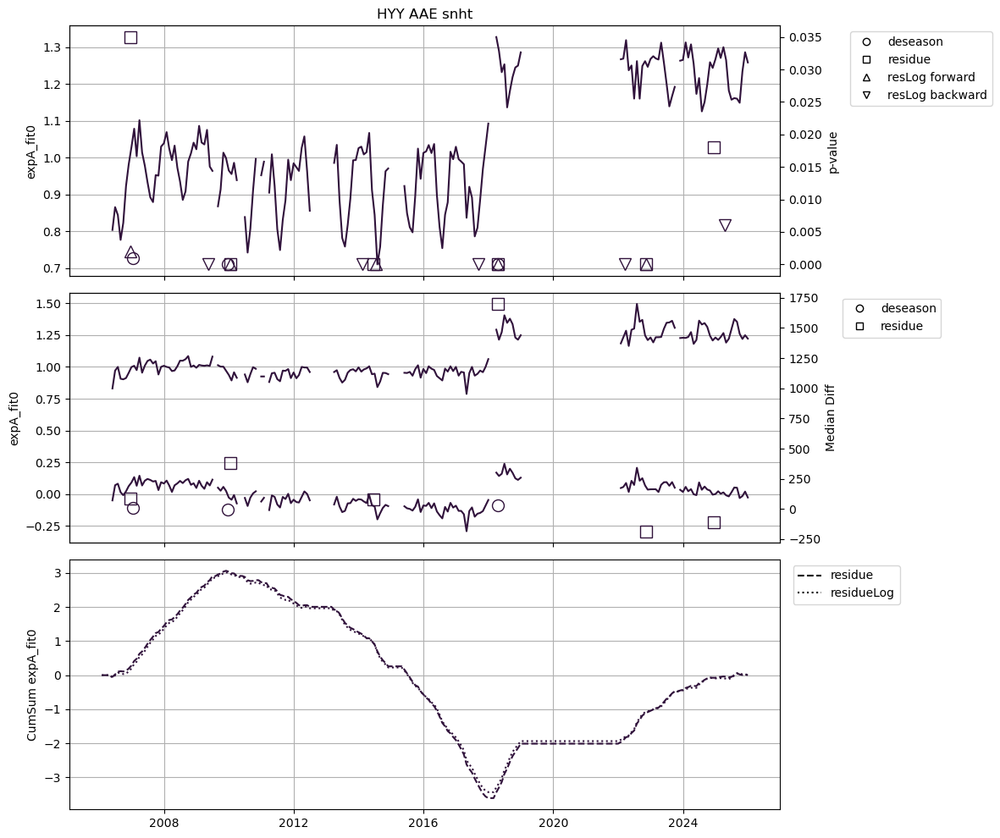

In [100]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[3:4],0.05,'HYY','AAE', 'snht')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'snht')

In [101]:
T_HYY_AAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expA_fit0_residue,2006-11-30,0.035,3.0,299.199640,86.169949,35.829530
1,expA_fit0_residueLog,2006-11-30,0.002,3.0,440.215785,108.172165,42.694594
2,expA_fit0_deseason,2006-12-31,0.001,3.0,10.557552,9.596466,7.295913
3,expA_fit0_residueLog_inv,2009-04-30,0.000,2.0,-684.042400,206.641355,82.282154
4,expA_fit0_deseason,2009-11-30,0.000,2.0,-5.172024,-5.016456,-5.641826
5,expA_fit0_residue,2009-12-31,0.000,2.0,125.109768,381.440336,-134.998781
6,expA_fit0_residueLog,2009-12-31,0.000,2.0,125.870495,406.243936,-136.006657
7,expA_fit0_residueLog_inv,2014-01-31,0.000,1.0,104.014842,-1573.030478,-43.263458
8,expA_fit0_residue,2014-05-31,0.000,3.0,47.234801,77.747125,397.144961
9,expA_fit0_residueLog,2014-06-30,0.000,3.0,35.791069,87.548201,641.895544


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

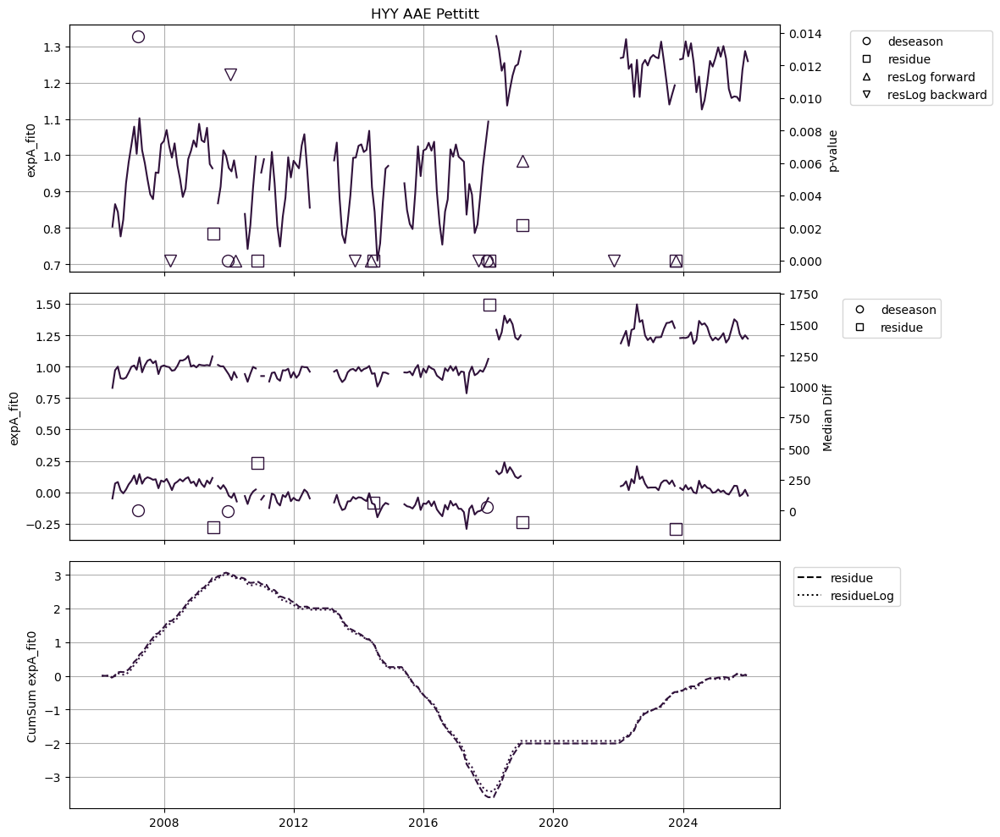

In [102]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[3:4],0.05,'HYY','AAE', 'Pettitt')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'Pettitt')

In [103]:
T_HYY_AAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expA_fit0_deseason,2007-02-28,1.378985e-02,0.005499,3.0,8.964526,5.645703,5.531075
1,expA_fit0_residueLog_inv,2008-02-29,1.556403e-05,0.000100,2.0,-483.115984,178.199125,72.384284
2,expA_fit0_residue,2009-06-30,1.676116e-03,0.001100,3.0,314.371775,-132.606263,-52.723768
3,expA_fit0_deseason,2009-11-30,6.305736e-07,0.000100,2.0,-5.174769,-5.204335,-5.970205
4,expA_fit0_residueLog_inv,2009-12-31,1.140710e-02,0.003500,3.0,251.466837,83.164259,51.047121
5,expA_fit0_residueLog,2010-02-28,1.058266e-15,0.000100,2.0,110.969573,397.249424,-131.813185
6,expA_fit0_residue,2010-10-31,2.965359e-16,0.000100,2.0,90.193047,385.622118,-134.563212
7,expA_fit0_residueLog_inv,2013-10-31,5.527050e-07,0.000100,1.0,103.707985,-1532.640345,-31.248130
8,expA_fit0_residueLog,2014-04-30,8.702106e-07,0.000100,3.0,33.518371,75.460335,481.108135
9,expA_fit0_residue,2014-05-31,2.420297e-07,0.000100,3.0,42.876058,65.716191,337.181529


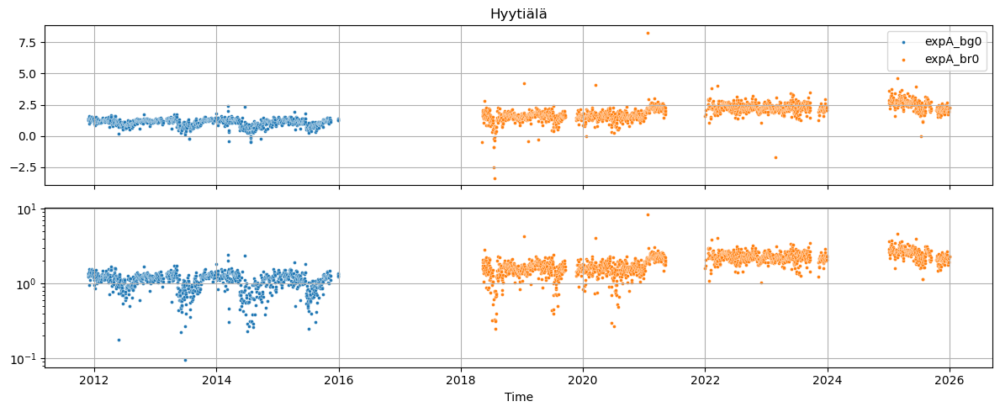

In [55]:
plotFig_var(HYY_cal, names_expA[4:7],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

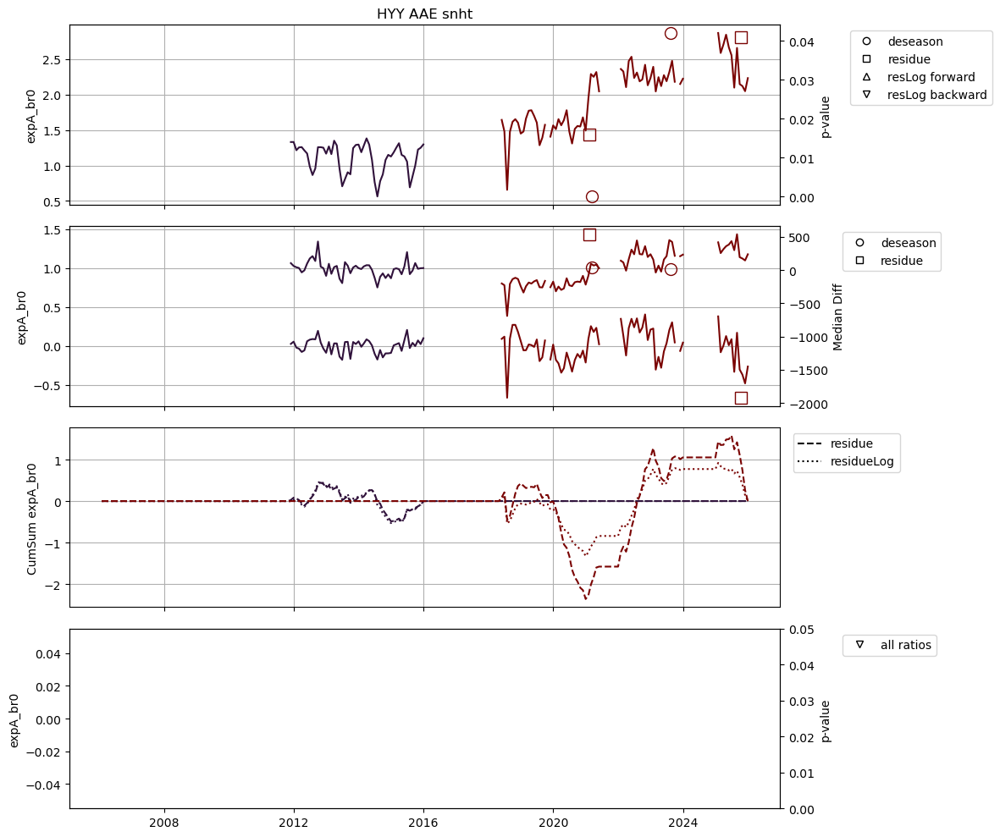

In [106]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[4:6],0.05,'HYY','AAE', 'snht')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'snht')

In [107]:
T_HYY_AAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expA_br0_residue,2021-01-31,0.016,2.0,-62.789533,539.402020,84.365684
1,expA_br0_deseason,2021-02-28,0.000,1.0,40.174446,35.936862,36.658845
2,expA_br0_deseason,2023-07-31,0.042,2.0,16.273989,10.291421,8.544806
3,expA_br0_residue,2025-09-30,0.041,1.0,66.287888,-1922.136063,-201.753025


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

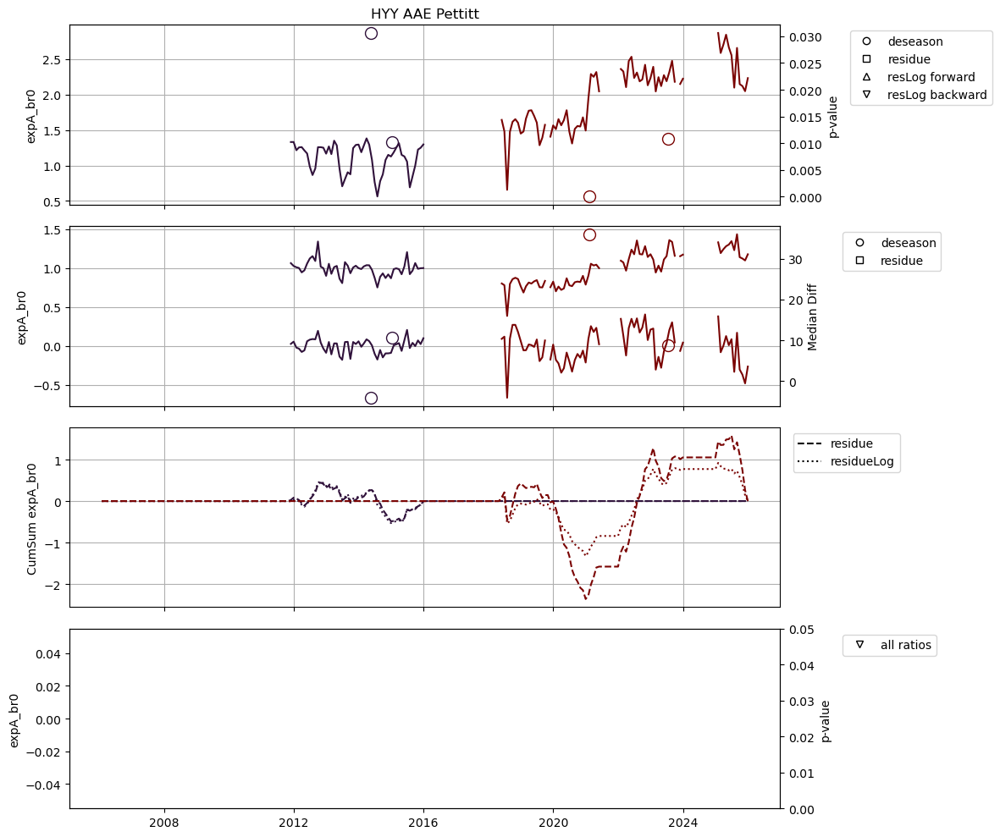

In [108]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[4:6],0.05,'HYY','AAE', 'Pettitt')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'Pettitt')

In [109]:
T_HYY_AAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expA_bg0_deseason,2014-04-30,3.062727e-02,0.016898,1.0,-5.557983,-4.082588,-5.710664
1,expA_bg0_deseason,2014-12-31,1.015580e-02,0.001300,2.0,11.127116,10.663015,10.304865
2,expA_br0_deseason,2021-01-31,1.315624e-11,0.000100,1.0,36.577846,35.962683,37.227128
3,expA_br0_deseason,2023-06-30,1.084756e-02,0.003700,2.0,16.394036,8.773195,8.449956


##### PM1

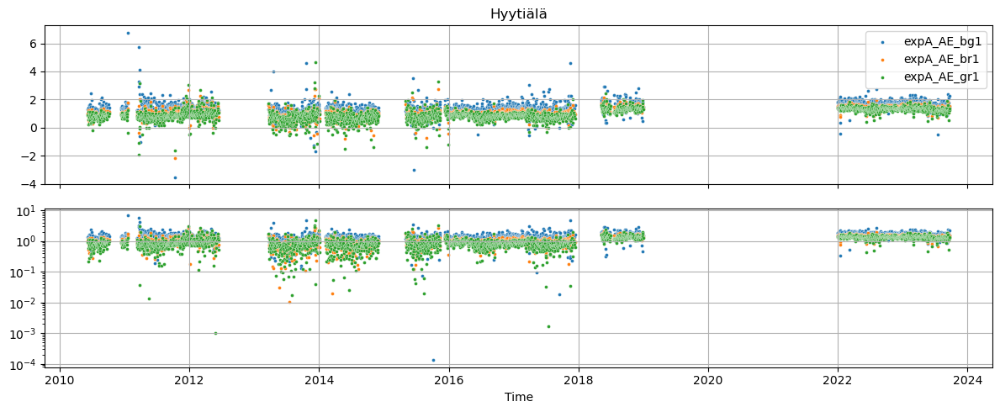

In [58]:
plotFig_var(HYY_cal, names_expA[7:10],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

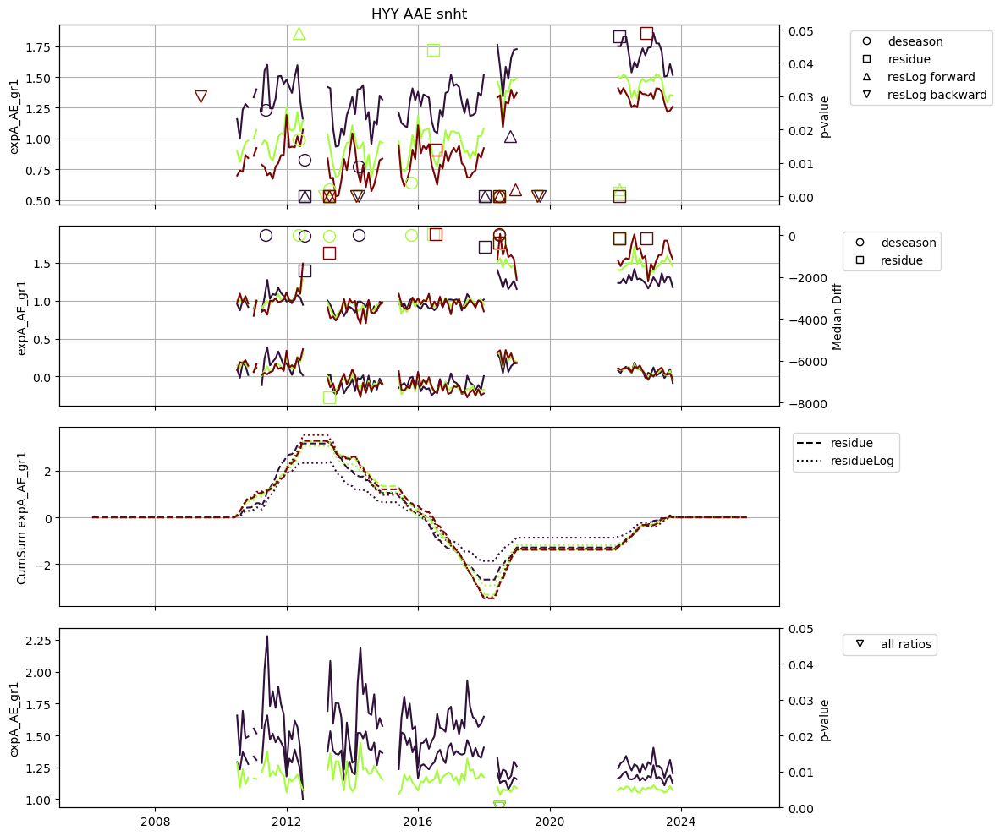

In [110]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[7:10],0.05,'HYY','AAE', 'snht')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'snht')

In [111]:
T_HYY_AAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expA_AE_gr1_residueLog_inv,2009-04-30,0.030,4.0,-780.946420,116.149377,61.053281
1,expA_AE_bg1_deseason,2011-04-30,0.026,3.0,13.677391,12.241989,13.808555
2,expA_AE_br1_residueLog,2012-04-30,0.049,2.0,247.906609,107.312140,56.624381
3,expA_AE_br1_deseason,2012-04-30,0.017,3.0,17.785994,17.337811,19.654128
4,expA_AE_bg1_deseason,2012-06-30,0.011,2.0,-3.548347,-6.323468,-8.089037
5,expA_AE_bg1_residue,2012-06-30,0.000,1.0,116.576843,-1673.735782,-70.802883
6,expA_AE_bg1_residueLog,2012-06-30,0.000,1.0,117.766724,-1365.976354,-72.636140
7,expA_AE_br1_residueLog_inv,2013-01-31,0.000,3.0,1836.408838,191.449936,81.681193
8,expA_AE_br1_deseason,2013-03-31,0.002,2.0,-11.017294,-6.571715,-7.947435
9,expA_AE_gr1_residue,2013-03-31,0.000,1.0,125.339298,-825.688619,-52.635581


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

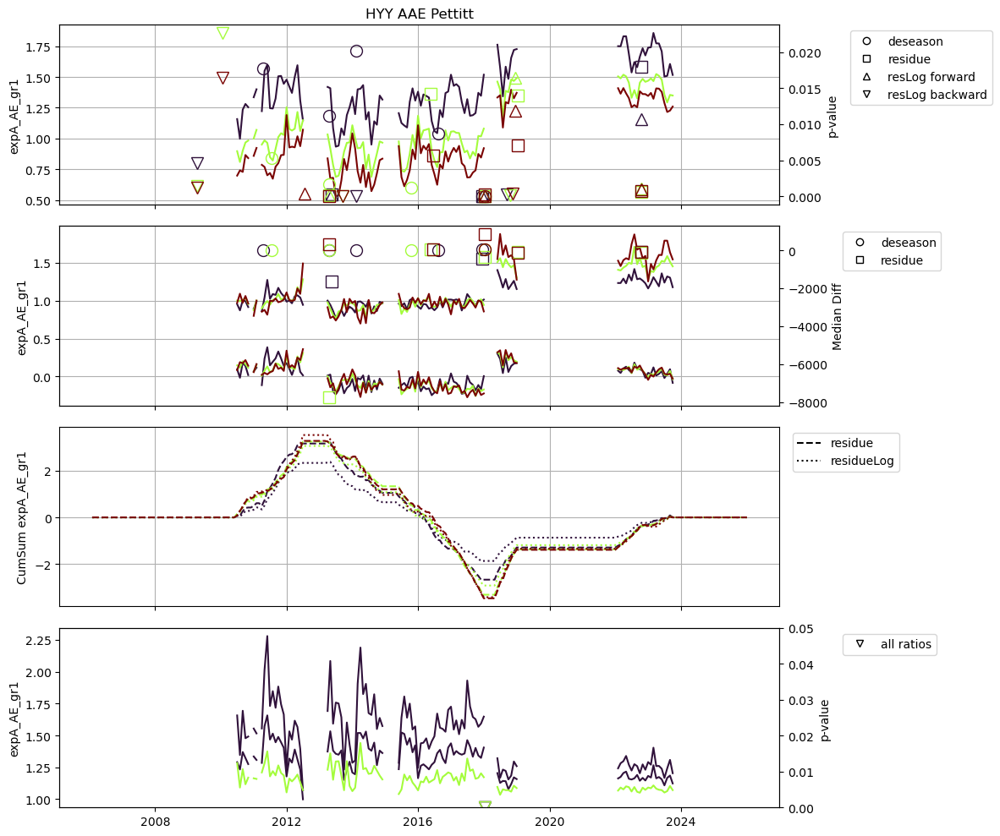

In [112]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[7:10],0.05,'HYY','AAE', 'Pettitt')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'Pettitt')

In [113]:
T_HYY_AAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expA_AE_gr1_residueLog_inv,2009-03-31,1.164890e-03,0.000200,3.0,-1373.691484,143.074212,89.618203
1,expA_AE_br1_residueLog_inv,2009-03-31,1.389454e-03,0.000200,3.0,972.911320,143.705606,71.550747
2,expA_AE_bg1_residueLog_inv,2009-03-31,4.539932e-03,0.001200,3.0,1194.910789,98.295351,82.305913
3,expA_AE_br1_residueLog_inv,2009-12-31,2.268225e-02,0.003000,4.0,103.149859,73.387641,63.364533
4,expA_AE_gr1_residueLog_inv,2009-12-31,1.647312e-02,0.001400,4.0,71.851405,82.817531,66.679176
5,expA_AE_bg1_deseason,2011-03-31,1.772550e-02,0.004400,3.0,7.938192,9.600348,12.519176
6,expA_AE_br1_deseason,2011-06-30,5.326722e-03,0.000700,3.0,11.055261,2.790390,13.887088
7,expA_AE_gr1_residueLog,2012-06-30,3.793430e-04,0.000400,1.0,132.142016,-1546.844488,-45.191894
8,expA_AE_br1_residueLog,2013-03-31,8.049381e-05,0.000100,1.0,137.104185,-4320.603158,-53.151275
9,expA_AE_bg1_deseason,2013-03-31,1.115045e-02,0.007499,2.0,-3.848366,-5.499095,-8.004252


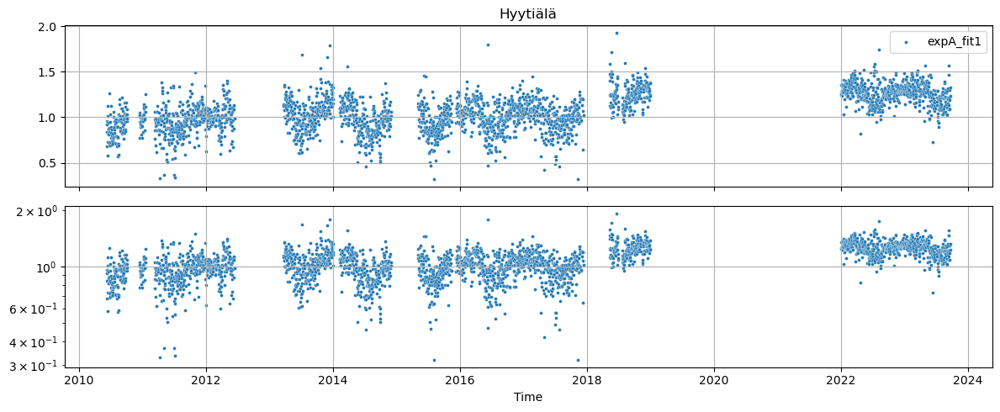

In [59]:
plotFig_var(HYY_cal, names_expA[10:11],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

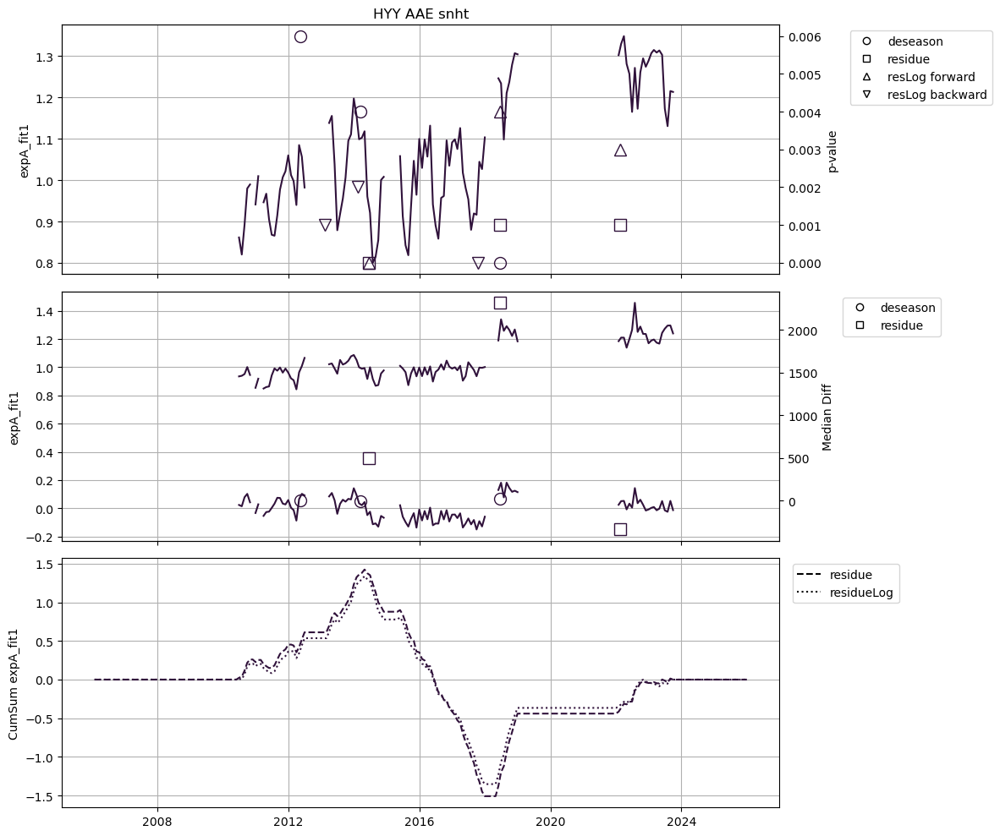

In [114]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[10:11],0.05,'HYY','AAE', 'snht')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'snht')

In [115]:
T_HYY_AAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expA_fit1_deseason,2012-04-30,0.006,2.0,7.117139,5.490542,5.257595
1,expA_fit1_residueLog_inv,2013-01-31,0.001,2.0,-733.280534,317.444138,87.166563
2,expA_fit1_residueLog_inv,2014-01-31,0.002,1.0,93.836069,1304.359786,-67.978409
3,expA_fit1_deseason,2014-02-28,0.004,3.0,-9.681089,-4.200748,-6.241968
4,expA_fit1_residue,2014-05-31,0.000,2.0,88.198729,494.272243,-150.252569
5,expA_fit1_residueLog,2014-05-31,0.000,2.0,84.397203,449.359229,-147.754536
6,expA_fit1_residueLog_inv,2017-09-30,0.000,2.0,-84.142080,-497.740010,146.896466
7,expA_fit1_deseason,2018-05-31,0.000,1.0,31.532519,25.361534,21.017835
8,expA_fit1_residue,2018-05-31,0.001,1.0,-92.126384,2318.407963,65.428967
9,expA_fit1_residueLog,2018-05-31,0.004,1.0,-93.836069,-1304.359786,67.978409


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

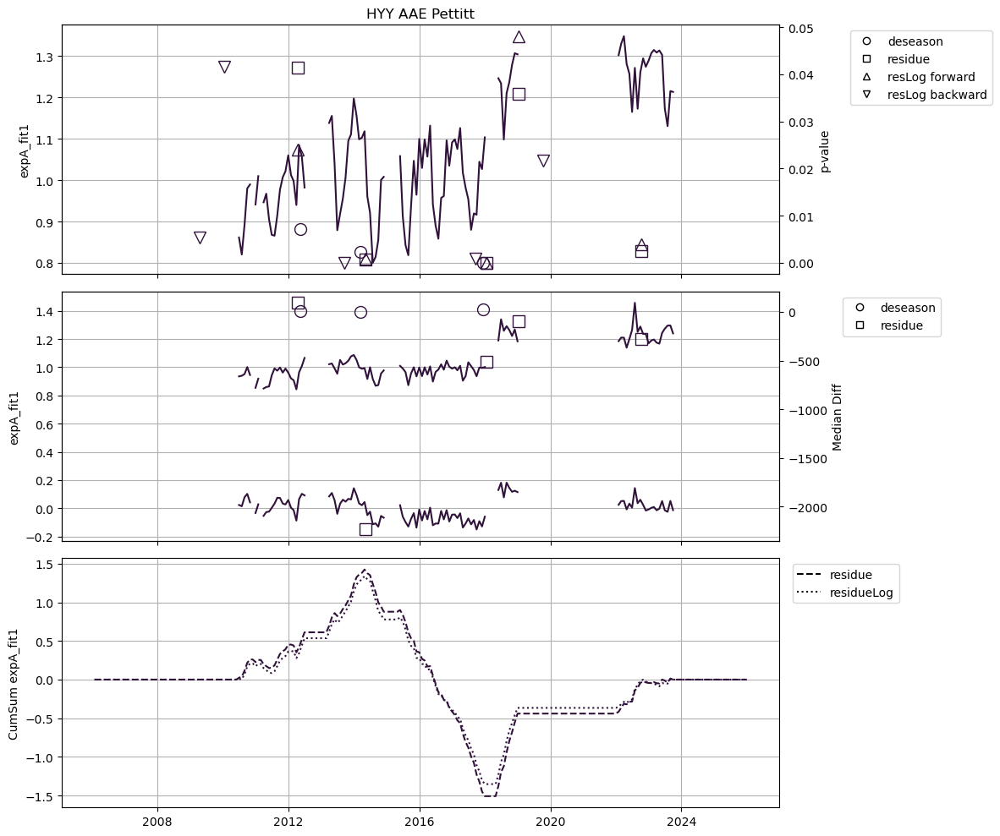

In [116]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[10:11],0.05,'HYY','AAE', 'Pettitt')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'Pettitt')

In [117]:
T_HYY_AAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expA_fit1_residueLog_inv,2009-03-31,5.276075e-03,0.001300,3.0,-251.207899,207.542713,82.605280
1,expA_fit1_residueLog_inv,2009-12-31,4.160416e-02,0.009599,4.0,368.991229,93.536949,60.241598
2,expA_fit1_residue,2012-03-31,4.147234e-02,0.021398,2.0,-83.728955,92.600778,30.431893
3,expA_fit1_residueLog,2012-03-31,2.401023e-02,0.010499,2.0,-87.770361,102.387713,34.317225
4,expA_fit1_deseason,2012-04-30,7.149157e-03,0.004700,2.0,7.151306,5.257792,5.269024
5,expA_fit1_residueLog_inv,2013-08-31,4.590293e-09,0.000100,2.0,96.598253,451.259285,-147.529008
6,expA_fit1_deseason,2014-02-28,2.273375e-03,0.001100,3.0,-9.880051,-4.551240,-6.218792
7,expA_fit1_residueLog,2014-04-30,8.682443e-04,0.000700,1.0,79.249089,1459.708305,-0.104855
8,expA_fit1_residue,2014-04-30,6.733270e-04,0.000600,1.0,78.953955,-2233.166699,16.870401
9,expA_fit1_residueLog_inv,2017-08-31,8.682443e-04,0.000500,1.0,-75.335039,-1459.708305,-2.205364


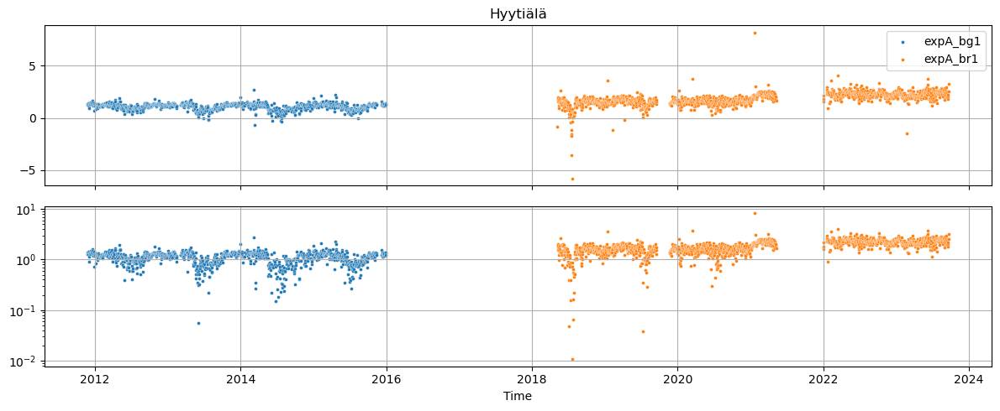

In [60]:
plotFig_var(HYY_cal, names_expA[11:],'')

c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

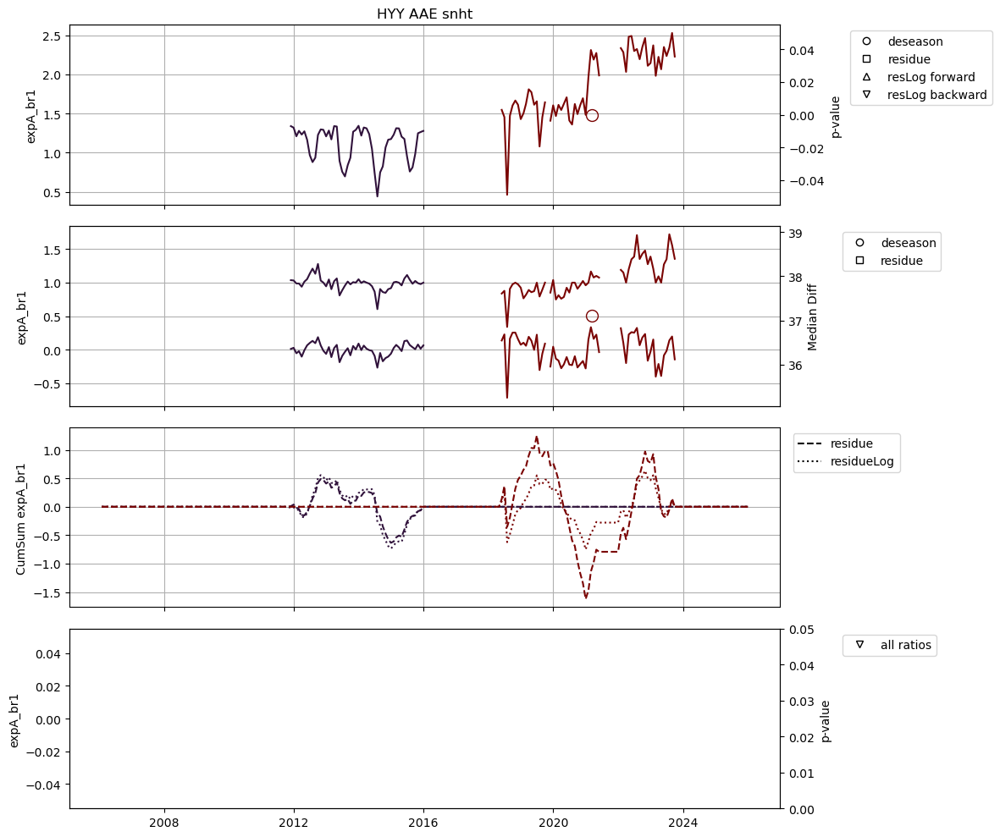

In [118]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[11:13],0.05,'HYY','AAE', 'snht')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'snht')

In [119]:
T_HYY_AAE

,param,Break_point,p_value,level,minDiff,medDiff,maxDiff
0,expA_br1_deseason,2021-02-28,0.0,1.0,32.580653,37.099027,37.99068


c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[param].replace([-np.inf, np.inf], np.nan, inplace=True)
c:\Users\ord1867\Desktop\Jordi\PhD\IPCC\LMS_residue.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example

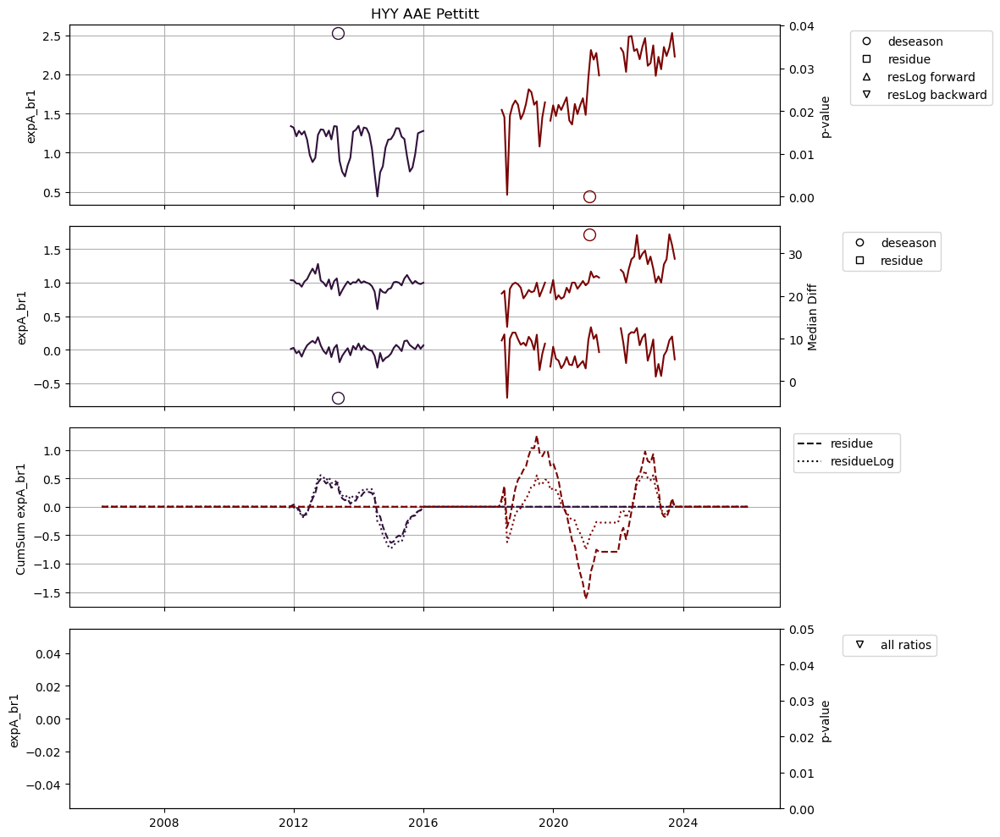

In [120]:
break_HYY_AAE = change_point_analysis_v4(HYY_cal,names_expA[11:13],0.05,'HYY','AAE', 'Pettitt')
T_HYY_AAE = make_table_breakpoints(break_HYY_AAE, 'Pettitt')

In [121]:
T_HYY_AAE

,param,Break_point,p_value,p_value_boot,level,minDiff,medDiff,maxDiff
0,expA_bg1_deseason,2013-04-30,3.821604e-02,0.022298,1.0,-9.299821,-3.919703,-10.77217
1,expA_br1_deseason,2021-01-31,1.266011e-08,0.000100,1.0,29.071686,34.508565,37.41233


### Save NetCDF

In [65]:
HYY_tr= HYY_rd.copy()
HYY_tr["y"] = HYY_tr.index.year

In [126]:
df=pd.merge(HYY_tr, HYY_cal,left_index=True, right_index=True)

In [127]:
ds=df.to_xarray()

for k, v in HYY_st.items():
    ds.attrs[k] = v
ds.to_netcdf("Stations/HYY/HYY.nc")